In [561]:
from sklearn import metrics, preprocessing
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression, Lasso, LogisticRegression
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import time

## Part 1 - Clustering
It includes 3 datasets (datos_1.csv, datos_2.csv y datos_3.csv). The main objective is to make use of three different clustering algorithms and experiment with their hyperparameters, and compare their results.


#### Dataset 1

In [50]:
df1 = pd.read_csv("./Datasets/datos_1.csv")
df1.head(10)

,x,y
0,-2.774647,0.594243
1,2.810131,-1.906226
2,-0.771306,-1.837186
3,-3.723523,2.219840
4,2.252406,-4.167869
5,-4.486353,3.051892
6,-4.080305,-1.593729
7,2.943454,-0.715352
8,0.338815,1.202014
9,-3.172861,-3.299885


In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       1000 non-null   float64
 1   y       1000 non-null   float64
dtypes: float64(2)
memory usage: 15.8 KB


In [19]:
df1.describe()

,x,y
count,1000.000000,1000.000000
mean,-0.059967,-0.052447
std,2.905553,2.797323
min,-4.988792,-4.998864
25%,-2.549947,-2.378579
50%,-0.108699,0.014169
75%,2.464127,2.383627
max,4.998113,4.998682


Text(0.5, 1.0, 'Datos 1 (x vs y)')

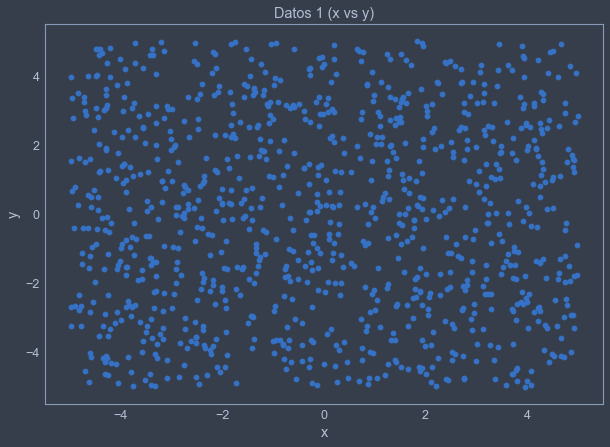

In [49]:
plt.figure(figsize=(10,7))
plt.scatter(df1['x'], df1['y'])
plt.ylabel('y')
plt.xlabel('x')
plt.title("Datos 1 (x vs y)")

Text(0.5, 1.0, 'Y - Histogram')

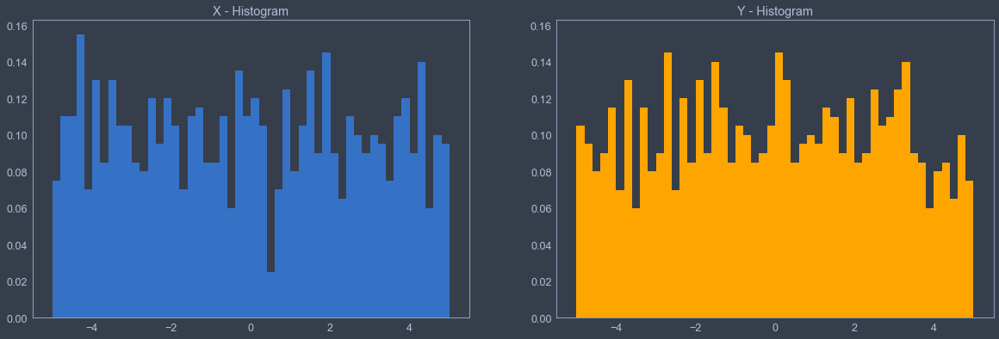

In [70]:
fig = plt.figure(figsize=(20,14))
ax1 = fig.add_subplot(221)
ax1.hist(df1["x"], bins=50, density=True)
ax1.set_title("X - Histogram")
ax2 = fig.add_subplot(222, sharex=ax1, sharey=ax1)
ax2.hist(df1["y"], bins=50, density=True, color = "orange");
ax2.set_title("Y - Histogram")

#### Dataset 2

In [52]:
df2 = pd.read_csv("./Datasets/datos_2.csv")
df2.head(10)

,x,y
0,4.025265,5.247585
1,4.903026,8.009764
2,5.218481,7.782231
3,6.512505,6.813810
4,2.228646,5.789084
5,6.631087,6.970445
6,6.422655,7.705468
7,6.304634,8.930887
8,6.084682,6.700482
9,3.477285,6.412273


In [54]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       1000 non-null   float64
 1   y       1000 non-null   float64
dtypes: float64(2)
memory usage: 15.8 KB


In [55]:
df2.describe()

,x,y
count,1000.000000,1000.000000
mean,2.789244,3.082187
std,2.788726,4.089496
min,-5.309351,-4.759839
25%,0.311867,-1.208107
50%,3.847302,4.159270
75%,5.071656,6.440545
max,7.626486,10.758939


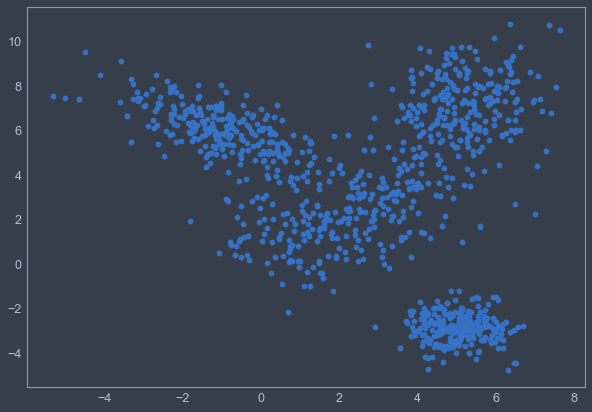

In [56]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"])

Text(0.5, 1.0, 'X - Histogram')

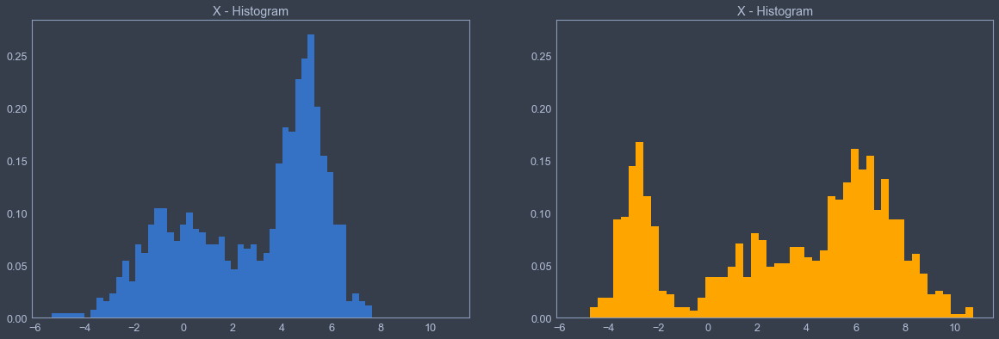

In [69]:
fig = plt.figure(figsize=(20,14))
ax1 = fig.add_subplot(221)
ax1.hist(df2["x"], bins=50, density=True)
ax1.set_title("X - Histogram")
ax2 = fig.add_subplot(222, sharex=ax1, sharey=ax1)
ax2.hist(df2["y"], bins=50, density=True, color="orange")
ax2.set_title("X - Histogram")

#### Dataset 3

In [71]:
df3 = pd.read_csv("./Datasets/datos_3.csv")
df3.head(10)

,x,y
0,-4.783624,-1.727666
1,-4.689450,-1.409477
2,-2.109597,-4.578214
3,-2.494805,-4.551264
4,-1.456520,-4.663991
5,2.331711,-4.833705
6,-1.507307,-4.877298
7,-1.508173,-5.029327
8,2.189130,-4.669970
9,-4.162320,-2.493985


In [72]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       990 non-null    float64
 1   y       990 non-null    float64
dtypes: float64(2)
memory usage: 15.6 KB


In [73]:
df3.describe()

,x,y
count,990.000000,990.000000
mean,-0.174813,-1.754343
std,6.432857,4.406313
min,-12.398400,-11.040570
25%,-4.401520,-4.630134
50%,-0.333272,-1.802936
75%,4.812369,1.768590
max,11.405215,8.314454


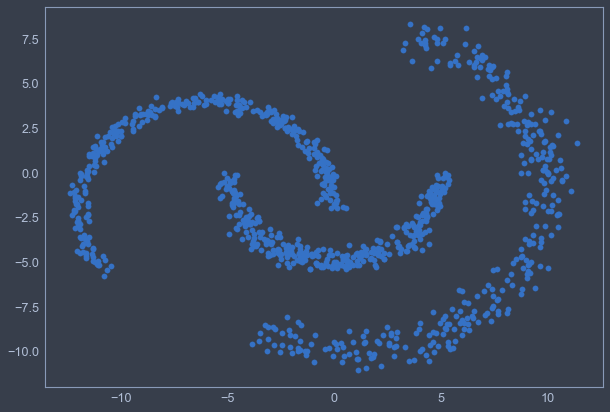

In [77]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"])

Text(0.5, 1.0, 'y')

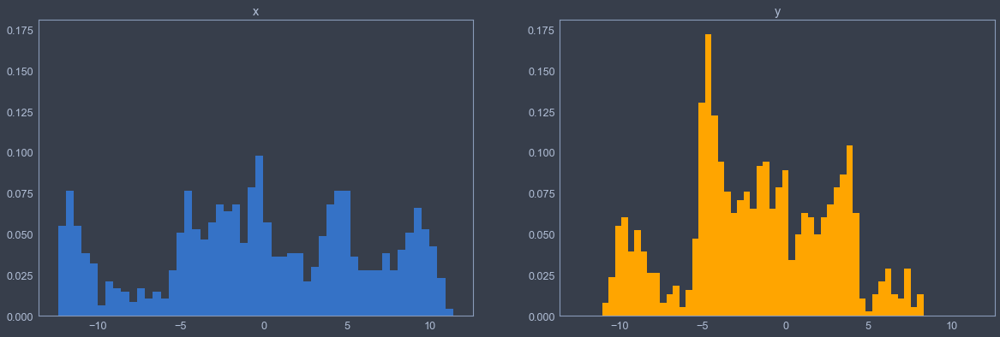

In [81]:
fig = plt.figure(figsize=(20,14))
ax1 = fig.add_subplot(221)
ax1.hist(df3["x"], bins=50, density=True)
ax1.set_title("x")
ax2 = fig.add_subplot(222, sharex=ax1, sharey=ax1)
ax2.hist(df3["y"], bins=50, density=True, color="orange")
ax2.set_title("y")

### KMeans

#### Dataset 1

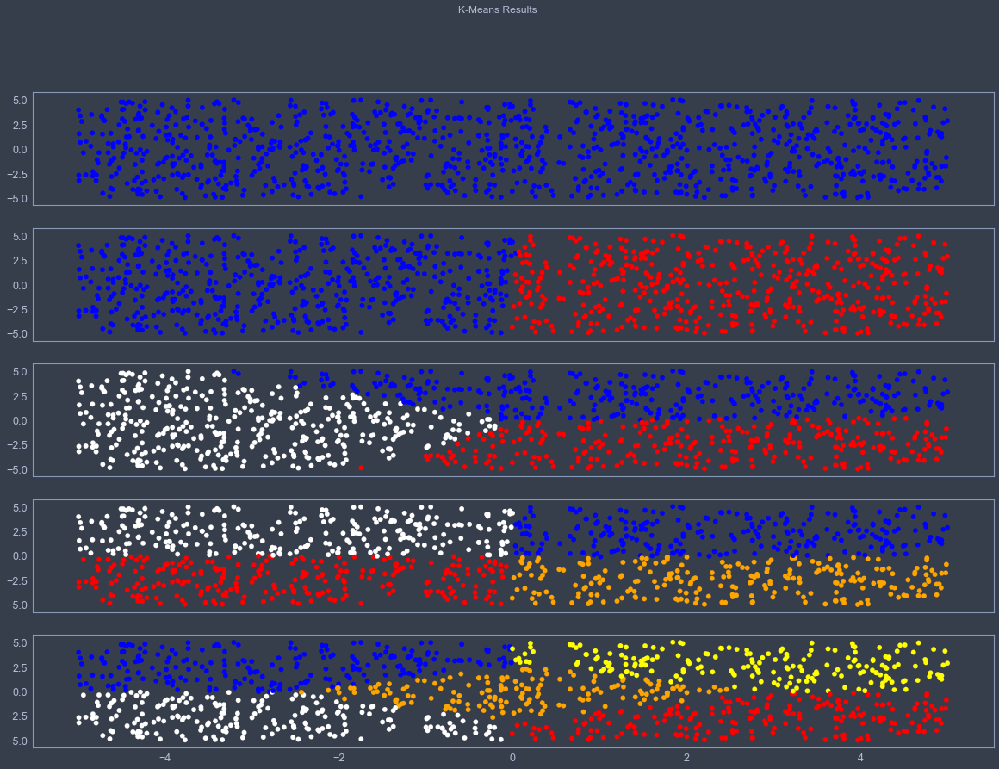

In [201]:
kmeans_results = {}
kmeans_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("K-Means Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df1);
    kmeans_results[f"{i}"] = kmeans.labels_
    kmeans_colors[f"{i}"] = np.array([c_list[i] for i in kmeans.labels_])
    axs[i-1].scatter(df1["x"], df1["y"], color=kmeans_colors[f"{i}"])
    

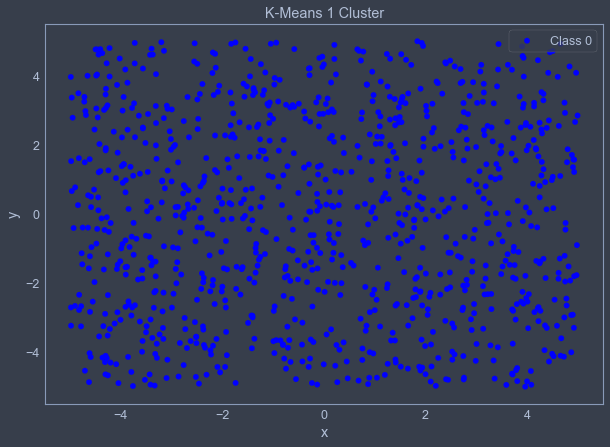

In [209]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], color=kmeans_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 1 Cluster");

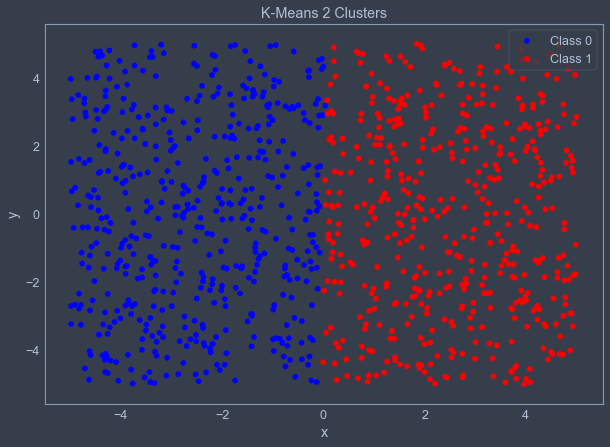

In [208]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = kmeans_results["2"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 2 Clusters");

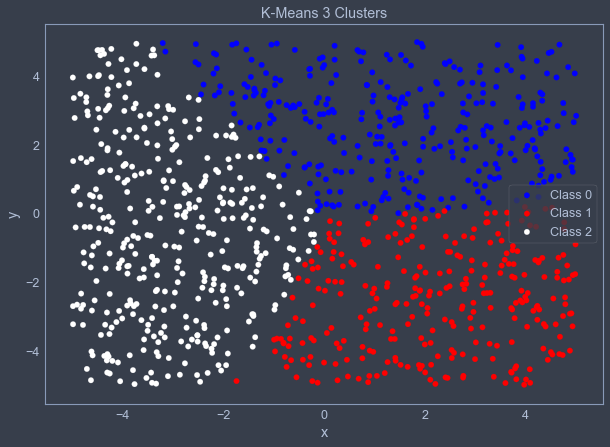

In [212]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = kmeans_results["3"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 3 Clusters");

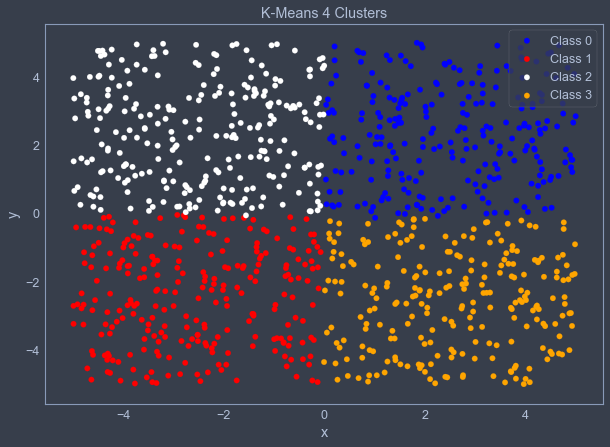

In [215]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = kmeans_results["4"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 4 Clusters");

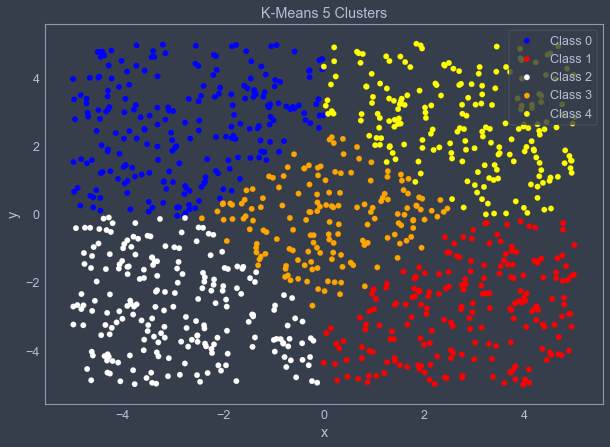

In [216]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = kmeans_results["5"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 5 Clusters");

#### Dataset 2

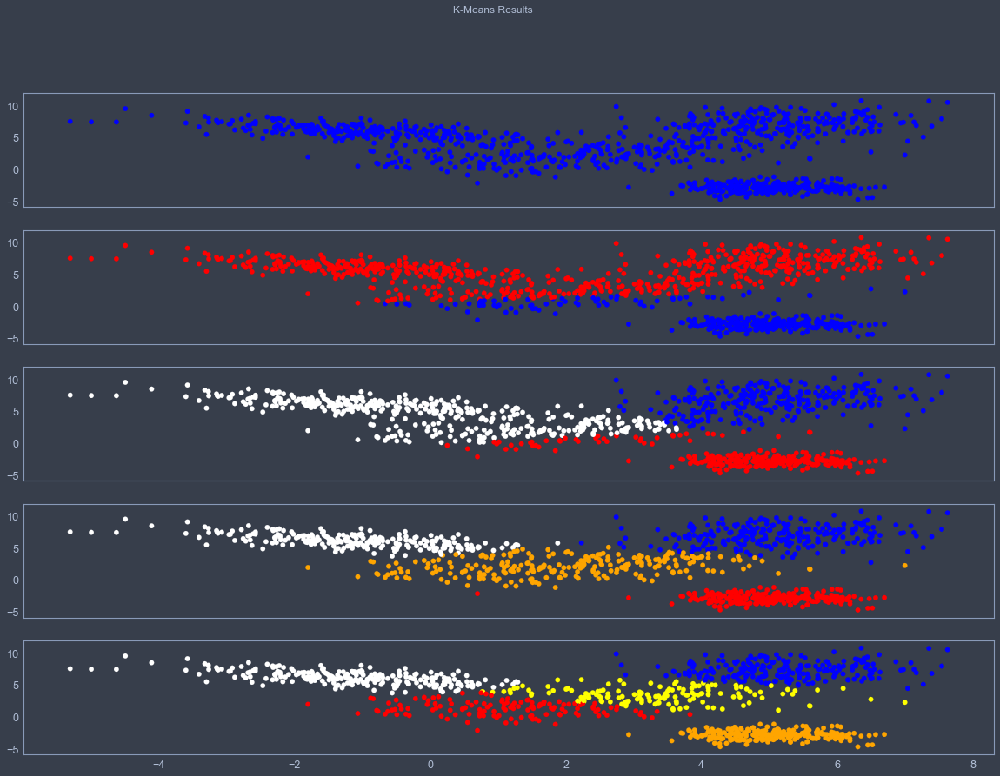

In [218]:
kmeans_results = {}
kmeans_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("K-Means Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df2);
    kmeans_results[f"{i}"] = kmeans.labels_
    kmeans_colors[f"{i}"] = np.array([c_list[i] for i in kmeans.labels_])
    axs[i-1].scatter(df2["x"], df2["y"], color=kmeans_colors[f"{i}"])

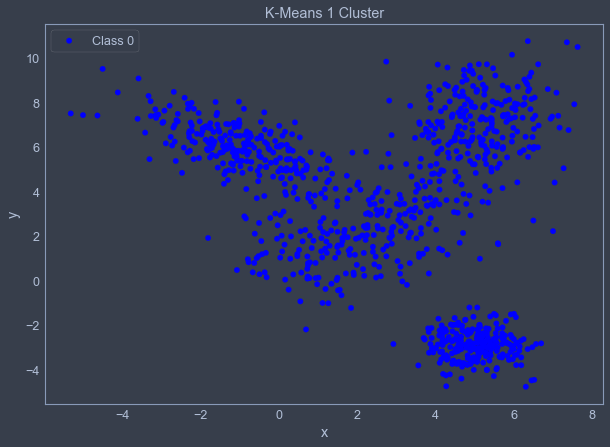

In [220]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], color=kmeans_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 1 Cluster");

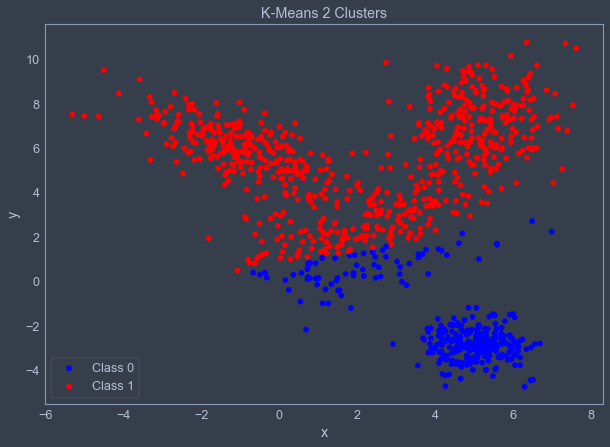

In [221]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = kmeans_results["2"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 2 Clusters");

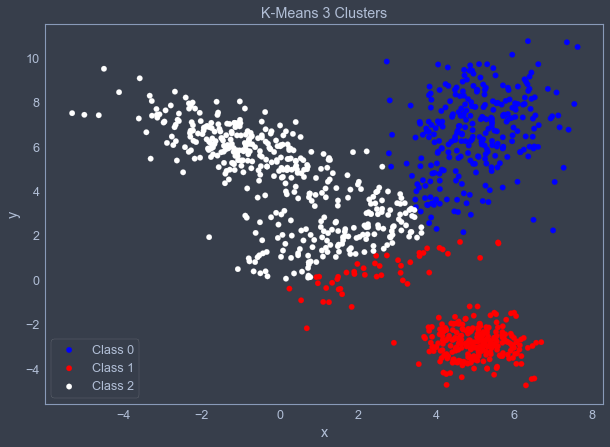

In [223]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = kmeans_results["3"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 3 Clusters");

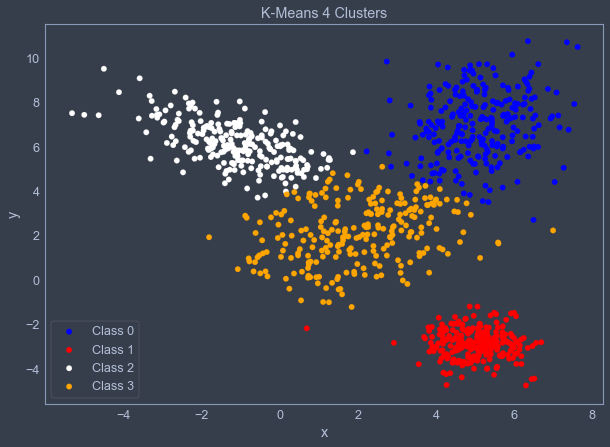

In [225]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = kmeans_results["4"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 4 Clusters");

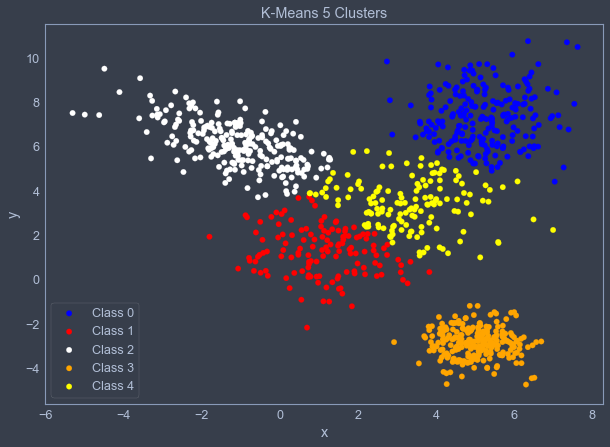

In [227]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = kmeans_results["5"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 5 Clusters");

#### Dataset 3

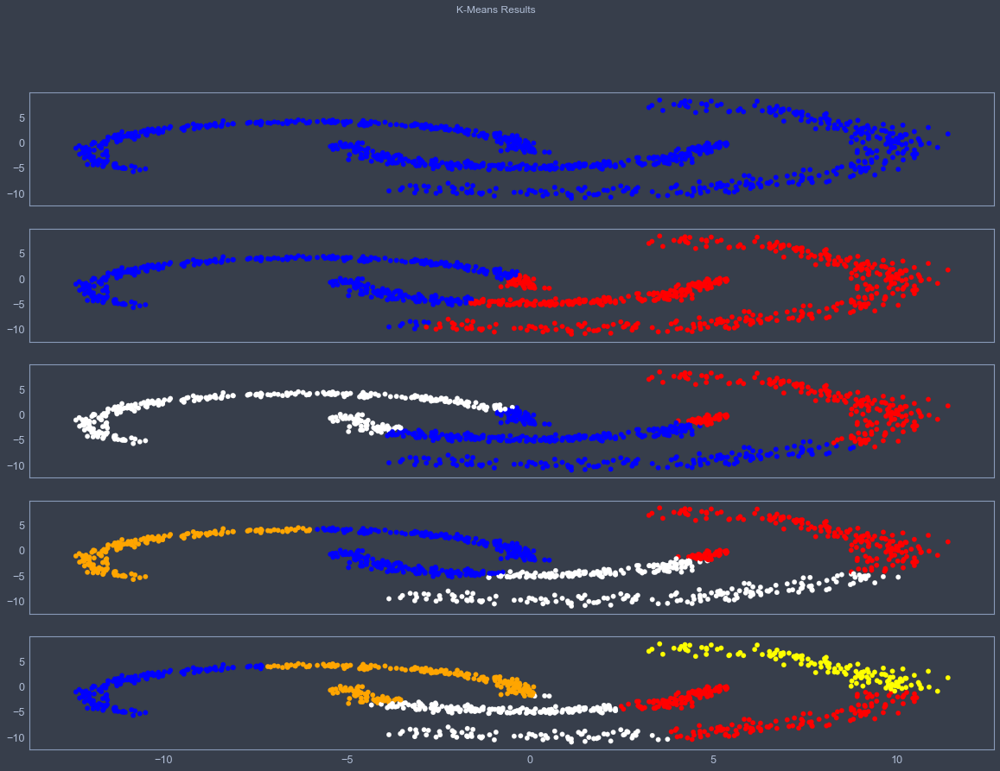

In [229]:
kmeans_results = {}
kmeans_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("K-Means Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df3);
    kmeans_results[f"{i}"] = kmeans.labels_
    kmeans_colors[f"{i}"] = np.array([c_list[i] for i in kmeans.labels_])
    axs[i-1].scatter(df3["x"], df3["y"], color=kmeans_colors[f"{i}"])

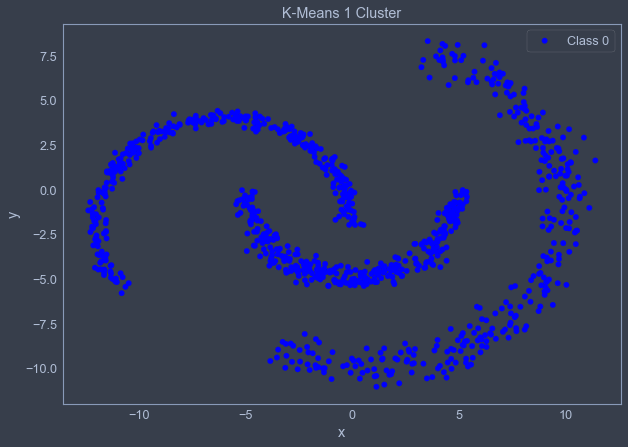

In [231]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], color=kmeans_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 1 Cluster");

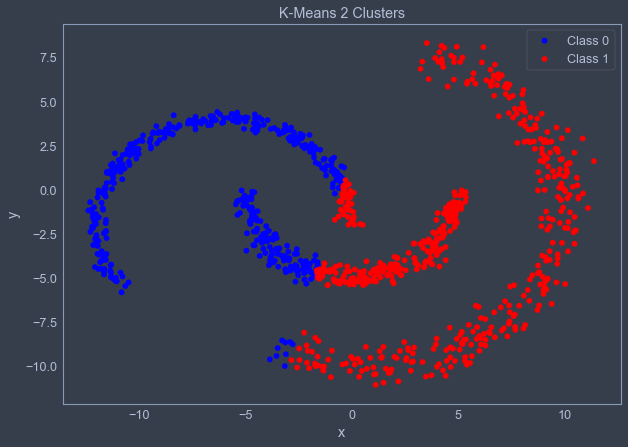

In [232]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = kmeans_results["2"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 2 Clusters");

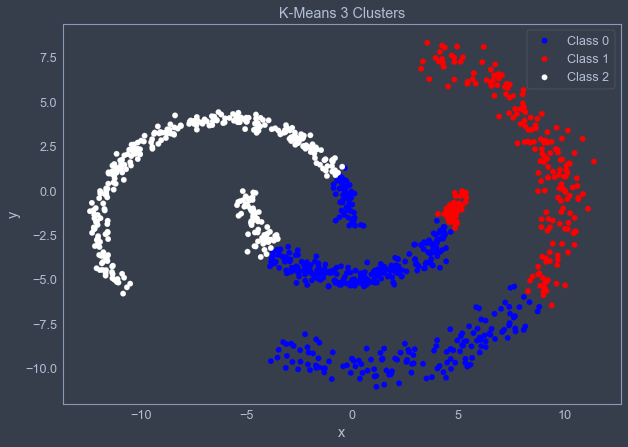

In [233]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = kmeans_results["3"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 3 Clusters");

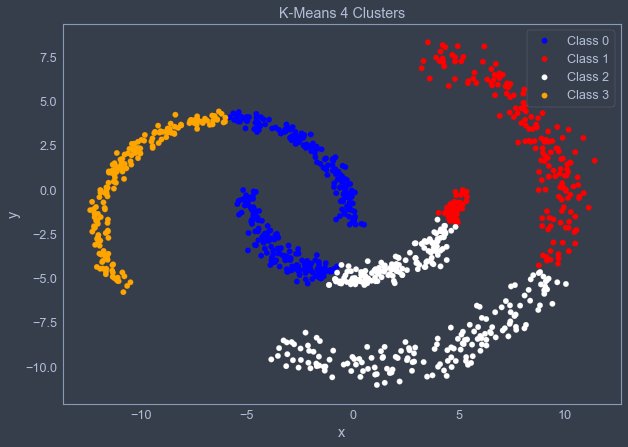

In [234]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = kmeans_results["4"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 4 Clusters");

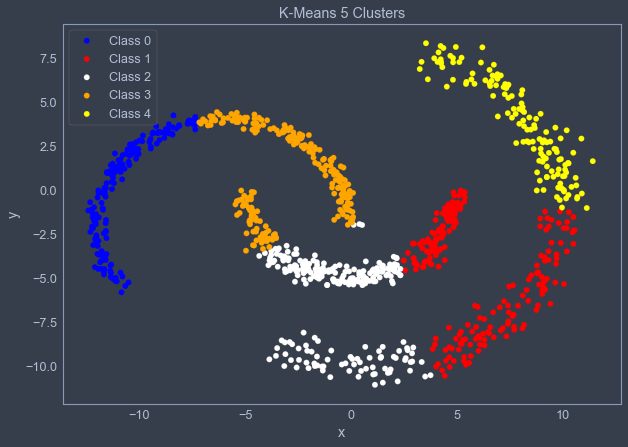

In [235]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = kmeans_results["5"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = kmeans_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("K-Means 5 Clusters");

### Single Linkage / Agglomerative Clustering

### By Number of Clusters

#### Dataset 1

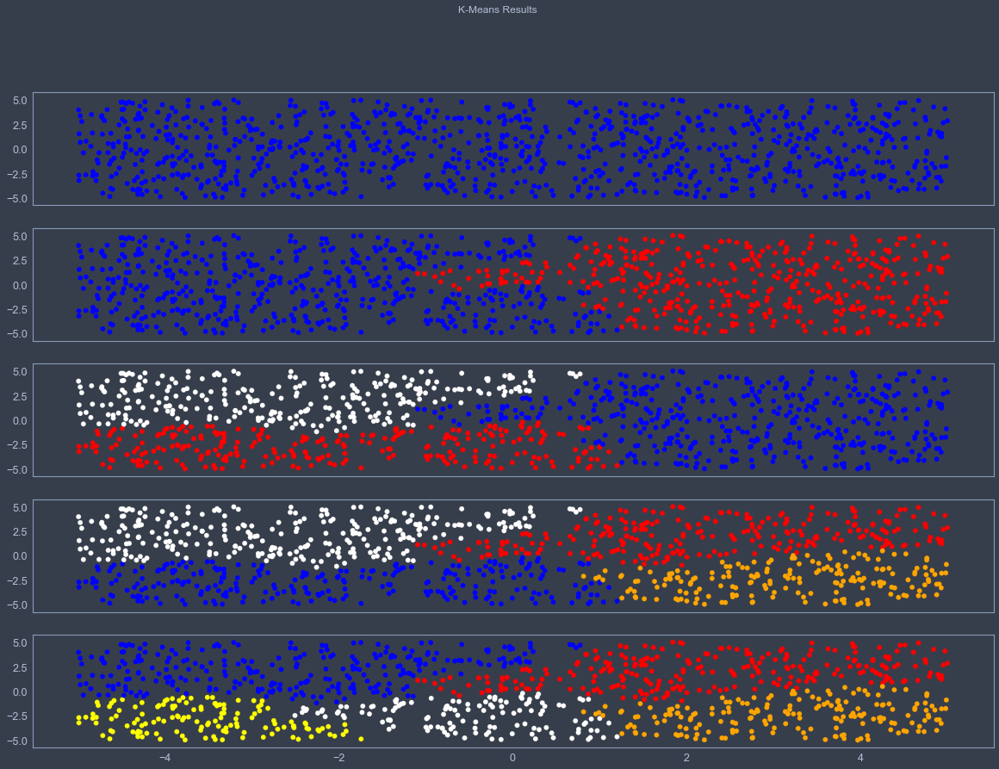

In [254]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    agg_clust = AgglomerativeClustering(n_clusters=i)
    agg_clust.fit(df1);
    agg_results[f"{i}"] = agg_clust.labels_
    agg_colors[f"{i}"] = np.array([c_list[i] for i in agg_clust.labels_])
    axs[i-1].scatter(df1["x"], df1["y"], color=agg_colors[f"{i}"])

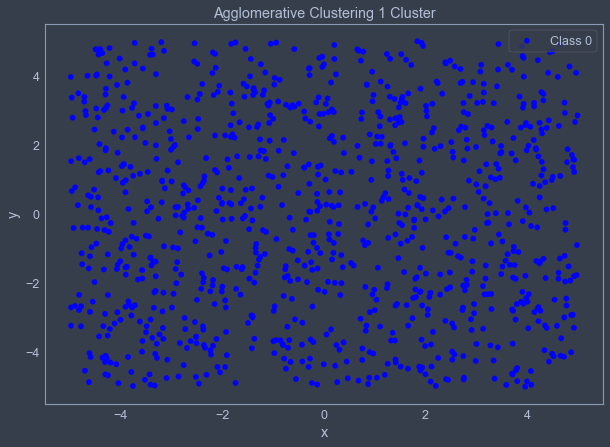

In [255]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], color=agg_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 1 Cluster");

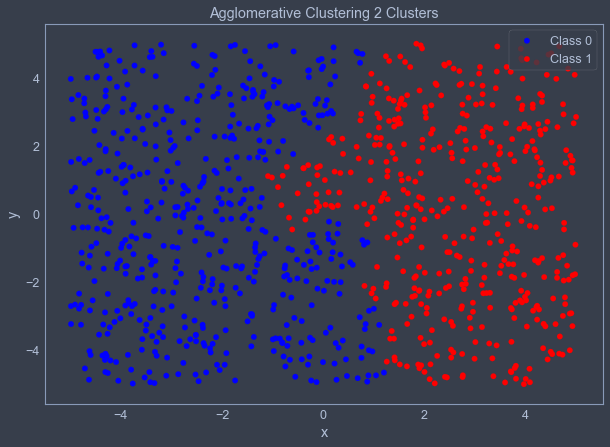

In [256]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = agg_results["2"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 2 Clusters");

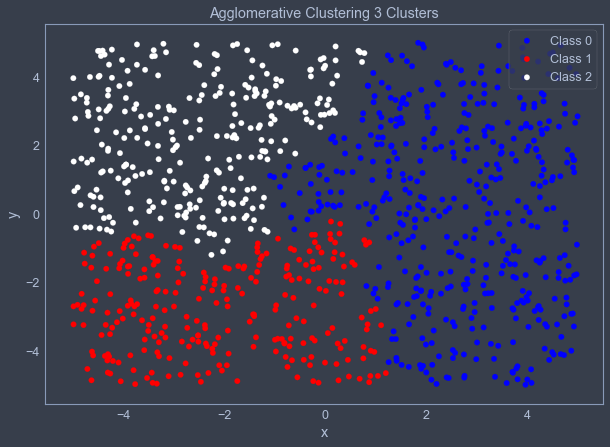

In [257]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = agg_results["3"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 3 Clusters");

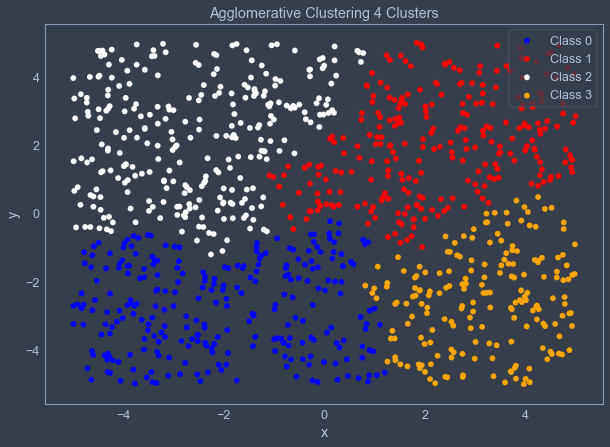

In [258]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = agg_results["4"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 4 Clusters");

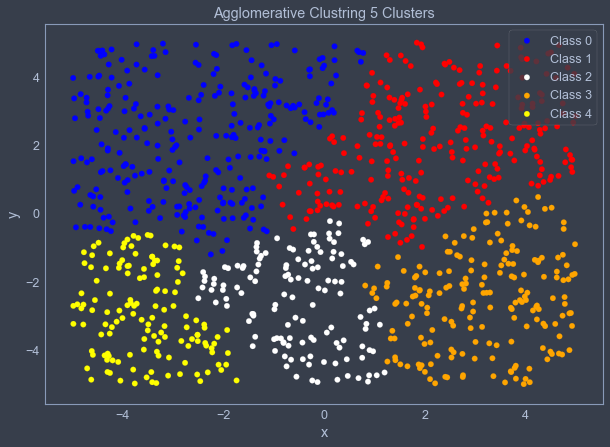

In [259]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = agg_results["5"]==i
    x = df1.loc[mask, "x"]
    y = df1.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustring 5 Clusters");

#### Dataset 2

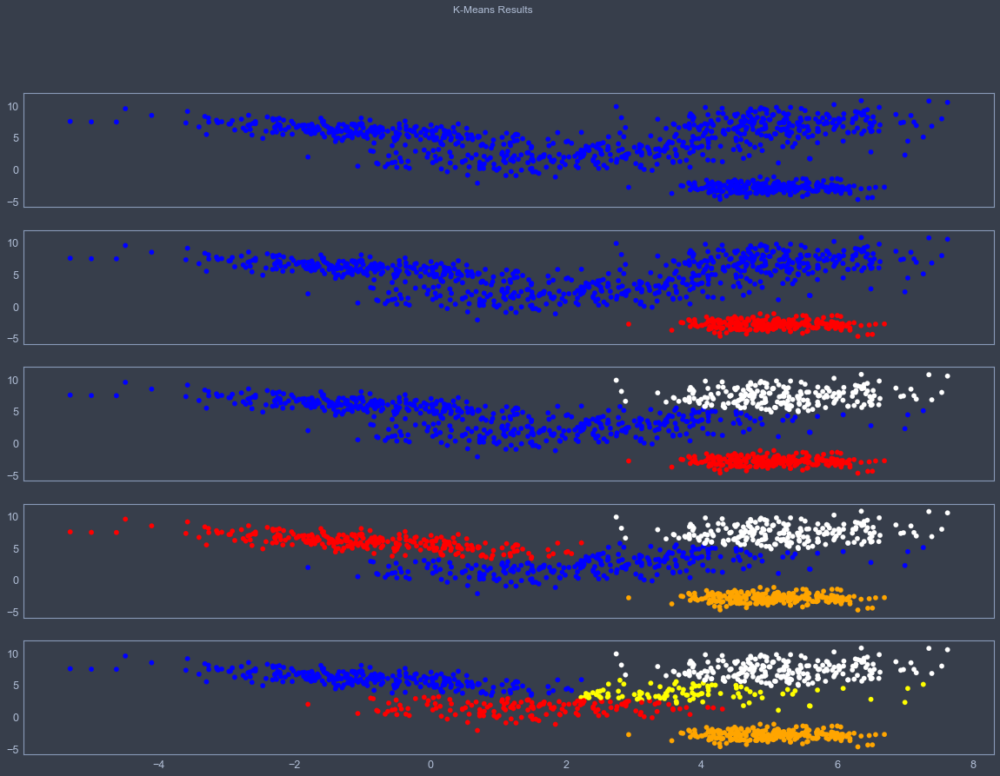

In [262]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    agg_clust = AgglomerativeClustering(n_clusters=i)
    agg_clust.fit(df2);
    agg_results[f"{i}"] = agg_clust.labels_
    agg_colors[f"{i}"] = np.array([c_list[i] for i in agg_clust.labels_])
    axs[i-1].scatter(df2["x"], df2["y"], color=agg_colors[f"{i}"])

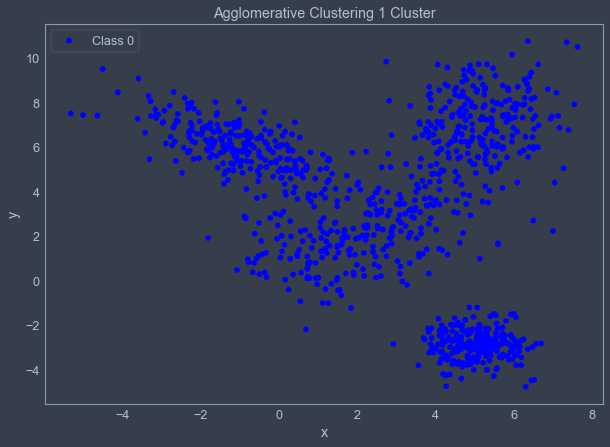

In [263]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], color=agg_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 1 Cluster");

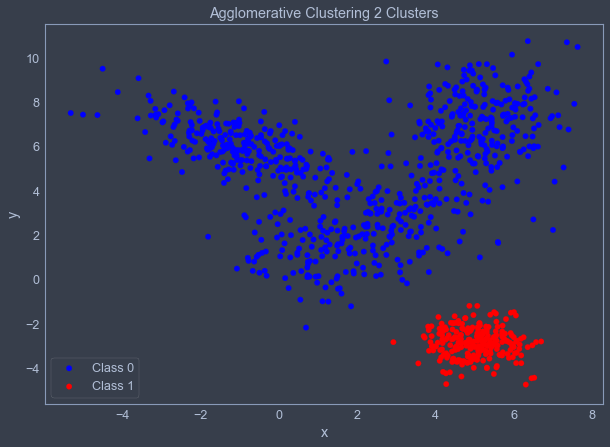

In [264]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = agg_results["2"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 2 Clusters");

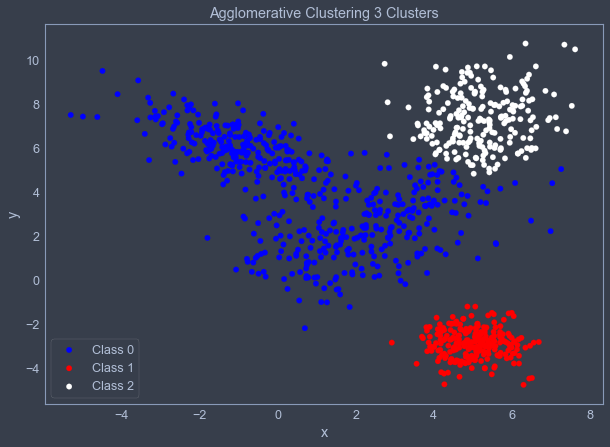

In [265]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = agg_results["3"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 3 Clusters");

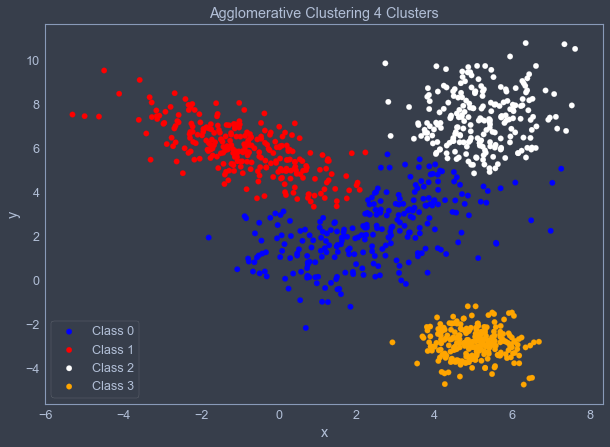

In [266]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = agg_results["4"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 4 Clusters");

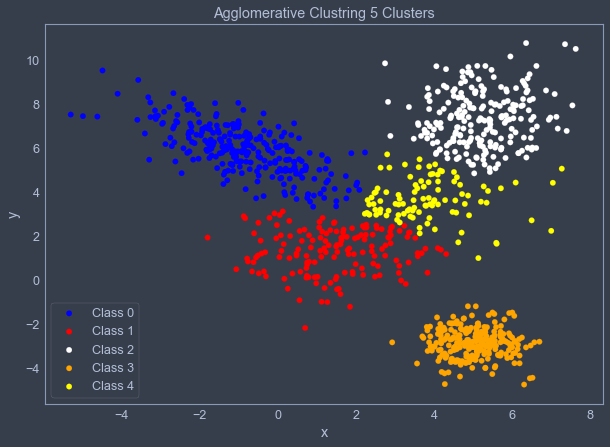

In [267]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = agg_results["5"]==i
    x = df2.loc[mask, "x"]
    y = df2.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustring 5 Clusters");

#### Dataset 3

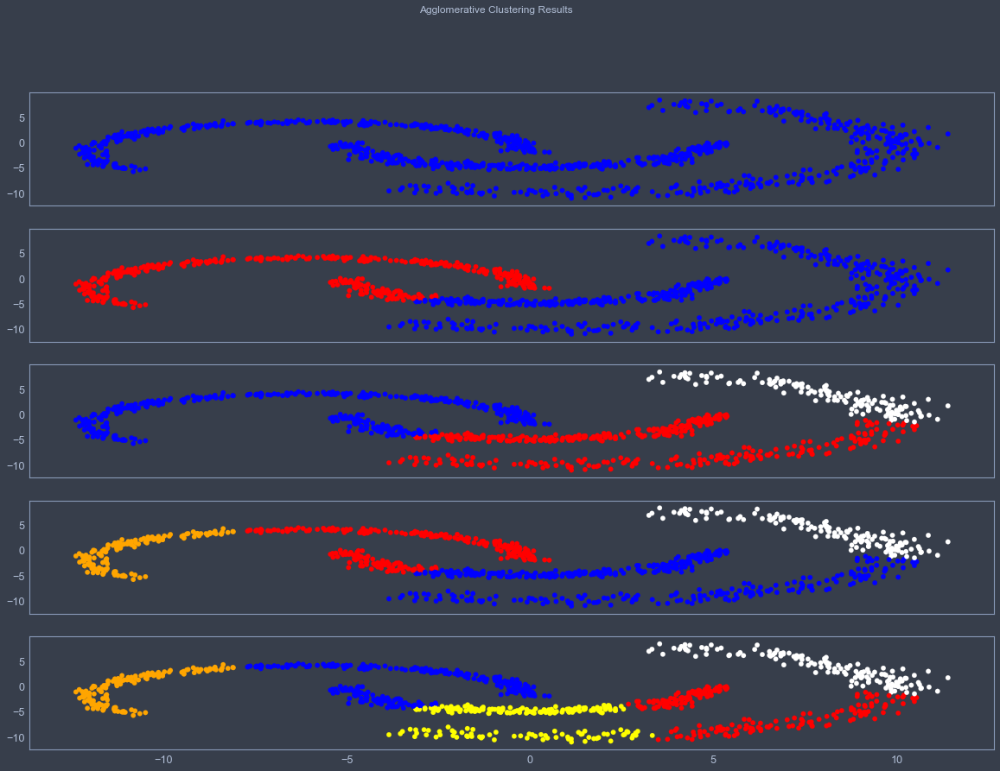

In [269]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")

c_list = ["blue", "red", "white", "orange", "yellow"]

for i in range(1, 6):
    agg_clust = AgglomerativeClustering(n_clusters=i)
    agg_clust.fit(df3);
    agg_results[f"{i}"] = agg_clust.labels_
    agg_colors[f"{i}"] = np.array([c_list[i] for i in agg_clust.labels_])
    axs[i-1].scatter(df3["x"], df3["y"], color=agg_colors[f"{i}"])

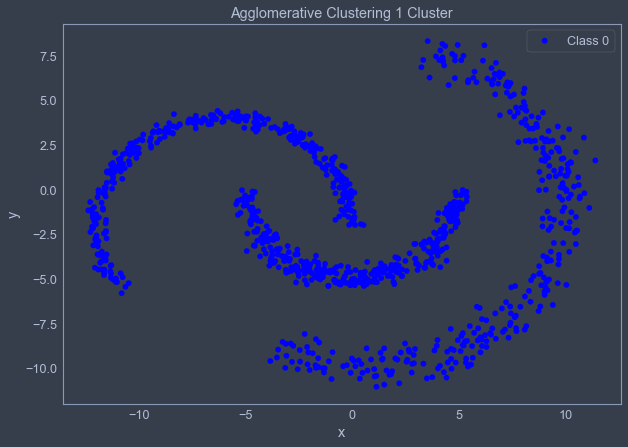

In [270]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], color=agg_colors["1"], label = "Class 0")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 1 Cluster");

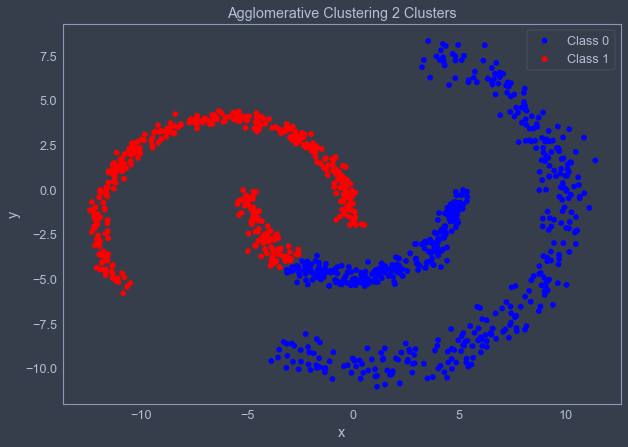

In [272]:
plt.figure(figsize=(10,7))
for i in range(2):
    mask = agg_results["2"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["2"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 2 Clusters");

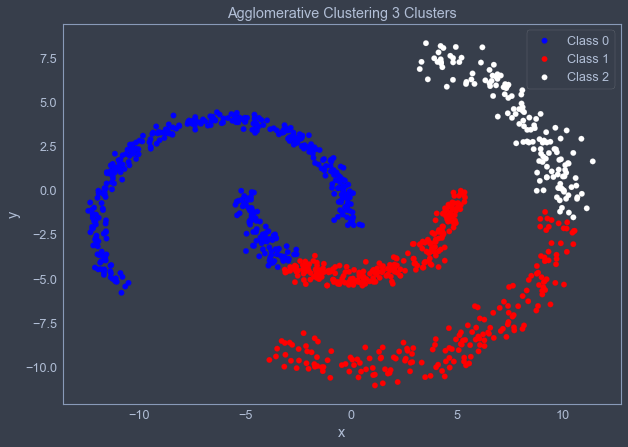

In [273]:
plt.figure(figsize=(10,7))
for i in range(3):
    mask = agg_results["3"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["3"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 3 Clusters");

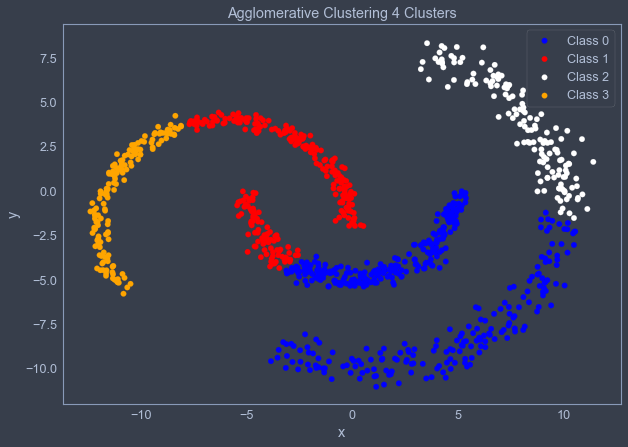

In [275]:
plt.figure(figsize=(10,7))
for i in range(4):
    mask = agg_results["4"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["4"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 4 Clusters");

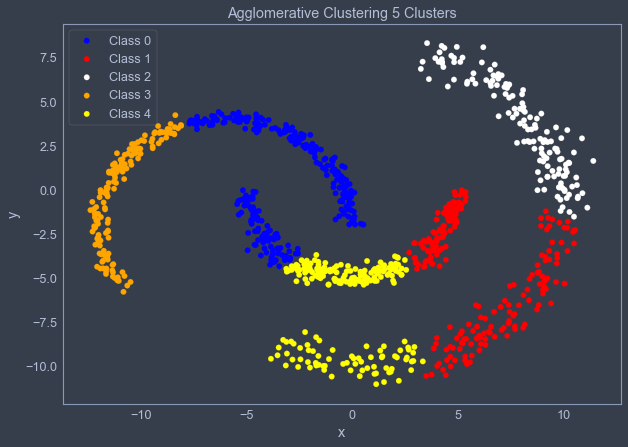

In [277]:
plt.figure(figsize=(10,7))
for i in range(5):
    mask = agg_results["5"]==i
    x = df3.loc[mask, "x"]
    y = df3.loc[mask, "y"]
    indices = x.index.values.astype(int)
    colors = agg_colors["5"][indices]
    plt.scatter(x, y, color=colors, label=f"Class {i}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Agglomerative Clustering 5 Clusters");

### By Distance

#### Dataset 1

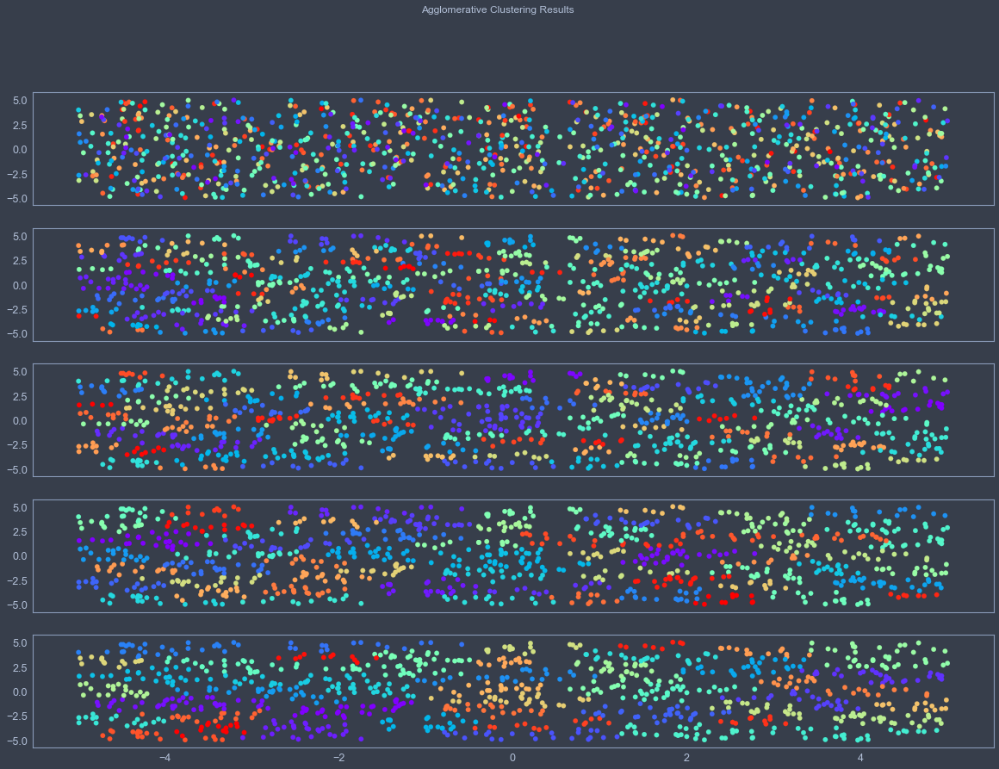

In [289]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")
thresholds = [0.25, 0.5, 0.75, 1.0, 1.5]

for i, thresh in enumerate(thresholds):
    agg_clust = AgglomerativeClustering(n_clusters=None, distance_threshold=i)
    agg_clust.fit(df1);
    agg_results[f"{thresh}"] = agg_clust.labels_
    axs[i].scatter(df1["x"], df1["y"], c=agg_results[f"{thresh}"], cmap='rainbow')

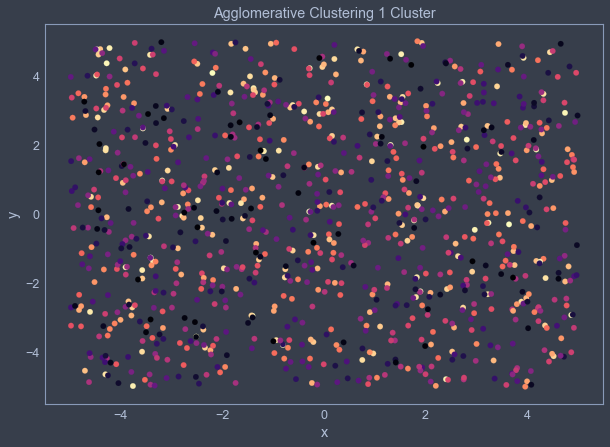

In [292]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=agg_results["0.25"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.25");

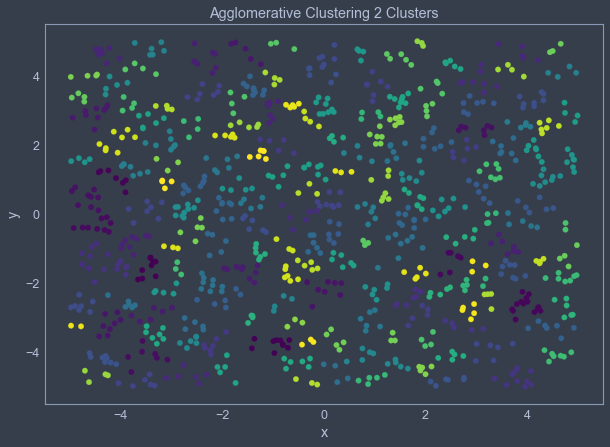

In [298]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=agg_results["0.5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.5");

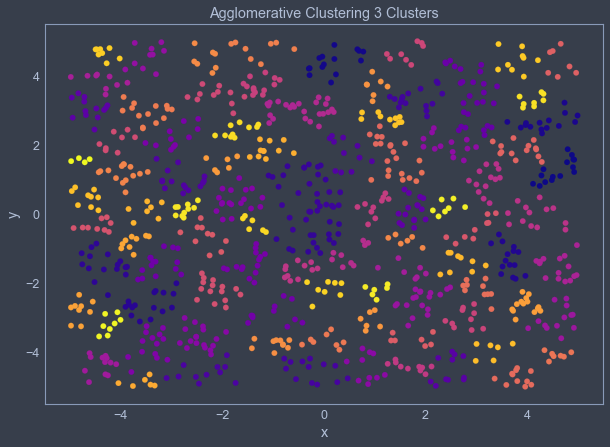

In [300]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=agg_results["0.75"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering 3 Threshold=0.75");

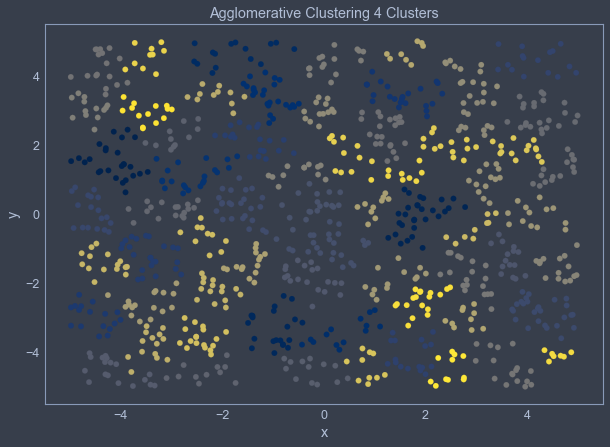

In [303]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=agg_results["1.0"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.0");

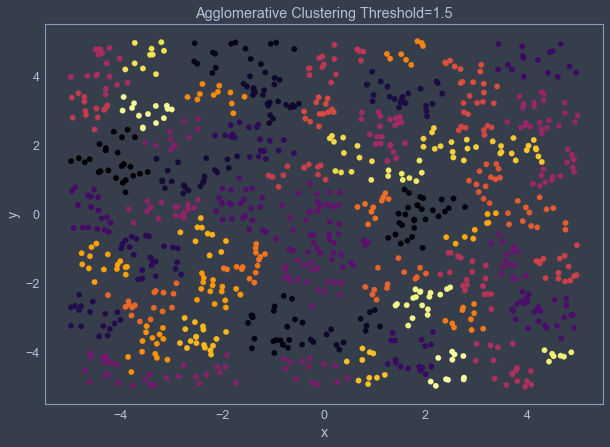

In [304]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=agg_results["1.0"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.5");

#### Dataset 2

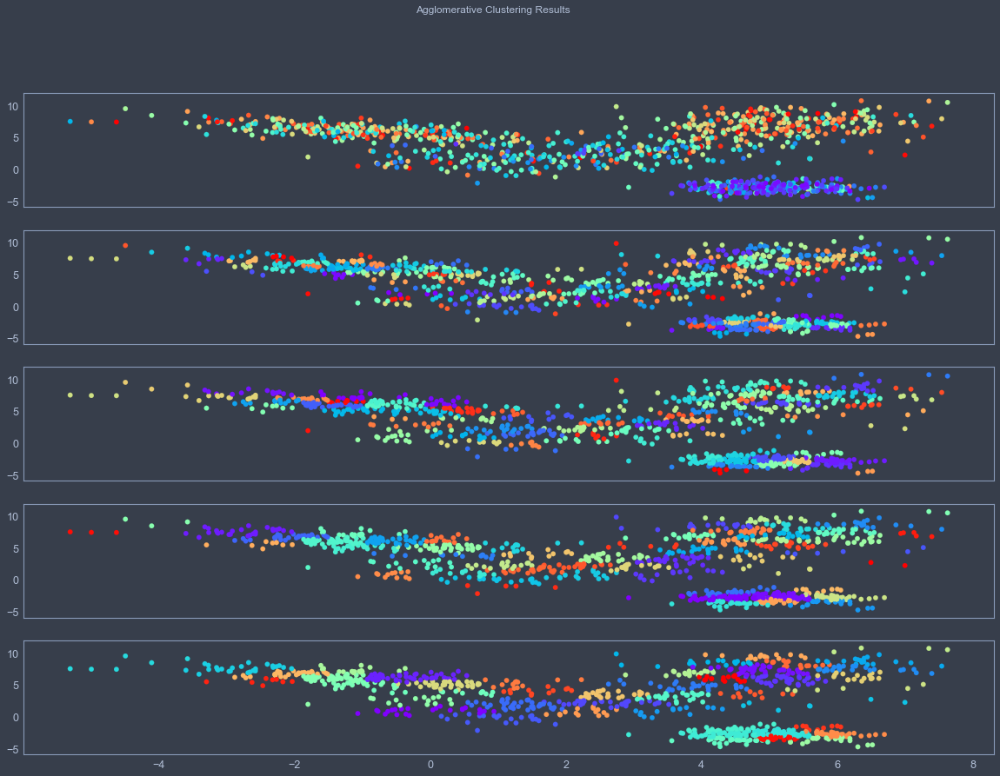

In [305]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")
thresholds = [0.25, 0.5, 0.75, 1.0, 1.5]

for i, thresh in enumerate(thresholds):
    agg_clust = AgglomerativeClustering(n_clusters=None, distance_threshold=i)
    agg_clust.fit(df2);
    agg_results[f"{thresh}"] = agg_clust.labels_
    axs[i].scatter(df2["x"], df2["y"], c=agg_results[f"{thresh}"], cmap='rainbow')

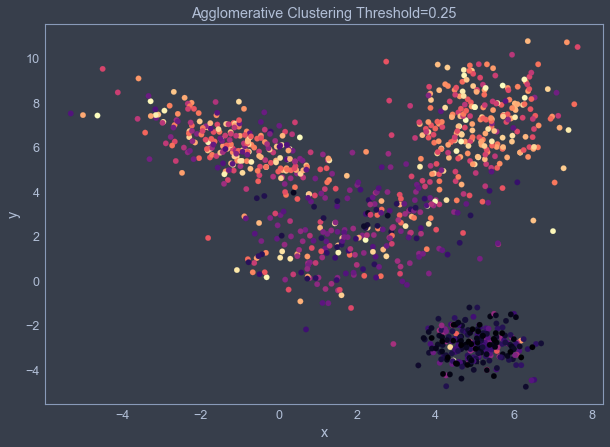

In [306]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=agg_results["0.25"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.25");

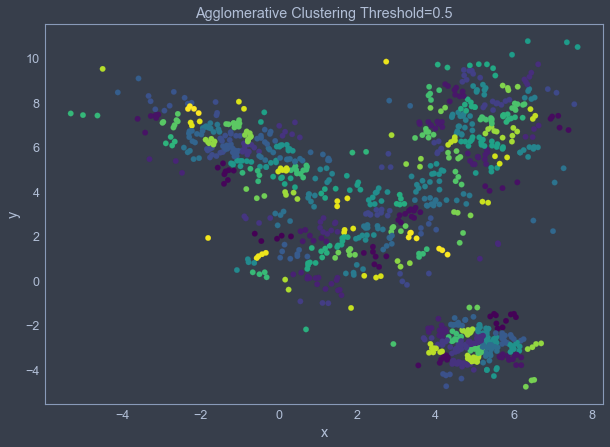

In [314]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=agg_results["0.5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.5");

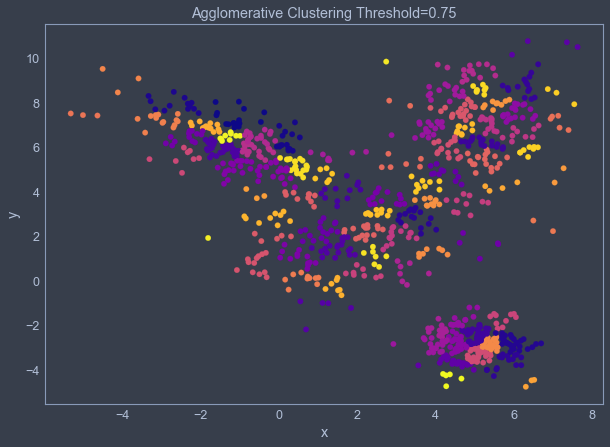

In [313]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=agg_results["0.75"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.75");

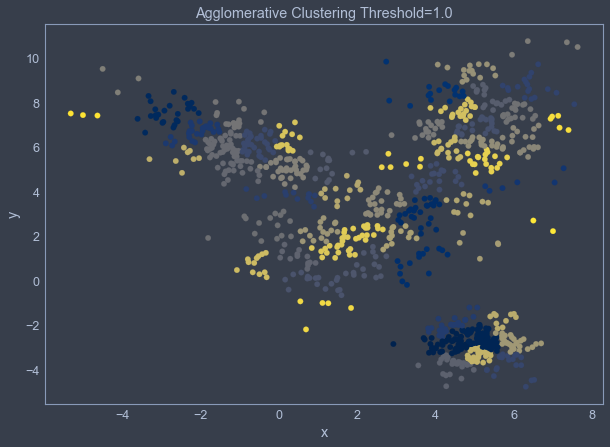

In [312]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=agg_results["1.0"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.0");

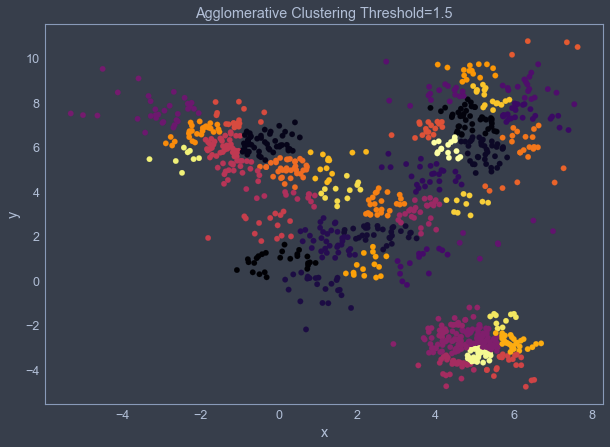

In [311]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=agg_results["1.5"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.5");

#### Dataset 3

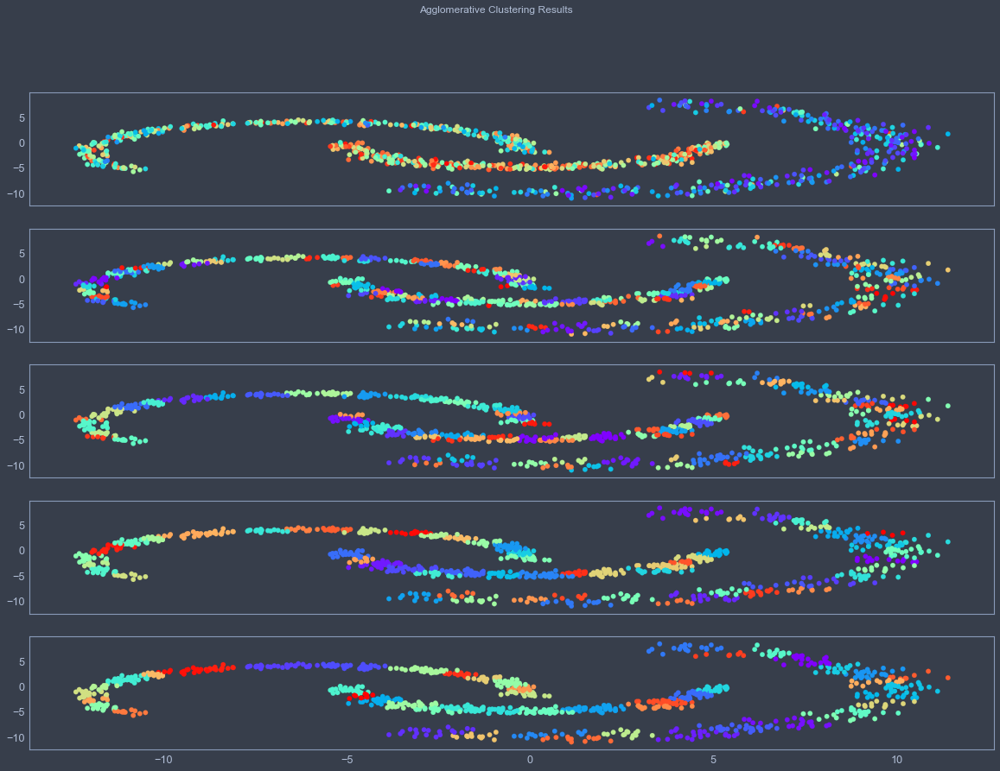

In [315]:
agg_results = {}
agg_colors = {}
fig, axs = plt.subplots(5, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("Agglomerative Clustering Results")
thresholds = [0.25, 0.5, 0.75, 1.0, 1.5]

for i, thresh in enumerate(thresholds):
    agg_clust = AgglomerativeClustering(n_clusters=None, distance_threshold=i)
    agg_clust.fit(df3);
    agg_results[f"{thresh}"] = agg_clust.labels_
    axs[i].scatter(df3["x"], df3["y"], c=agg_results[f"{thresh}"], cmap='rainbow')

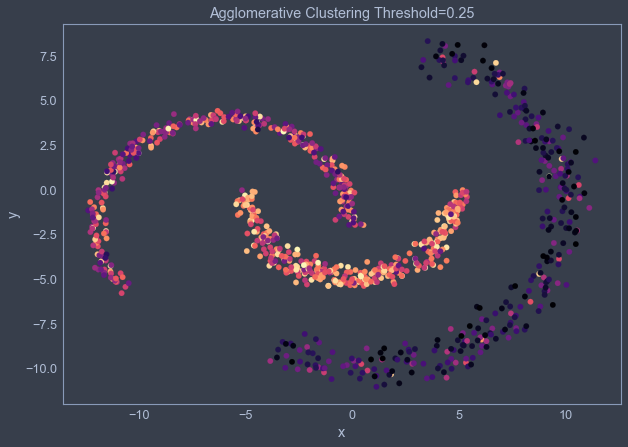

In [316]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=agg_results["0.25"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.25");

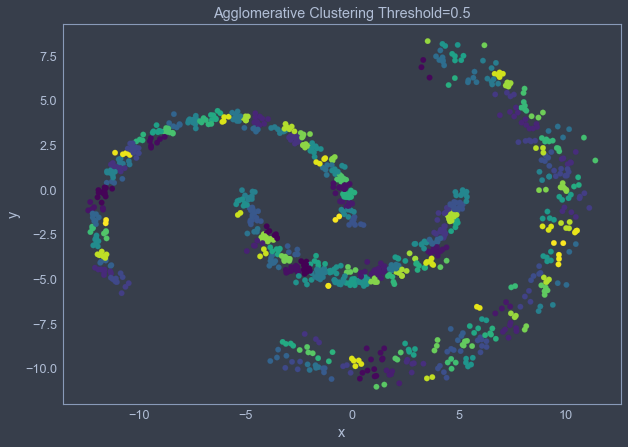

In [317]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=agg_results["0.5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.5");

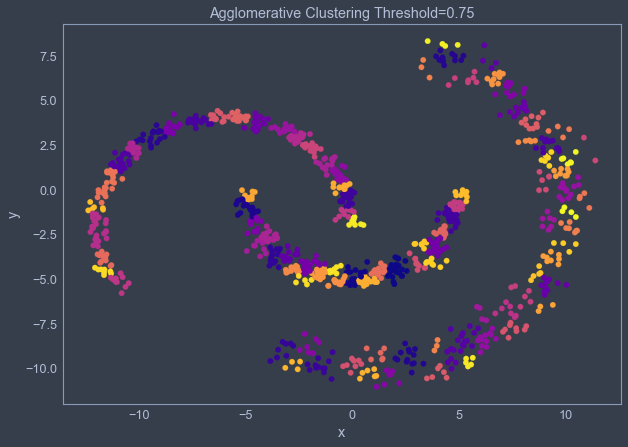

In [318]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=agg_results["0.75"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=0.75");

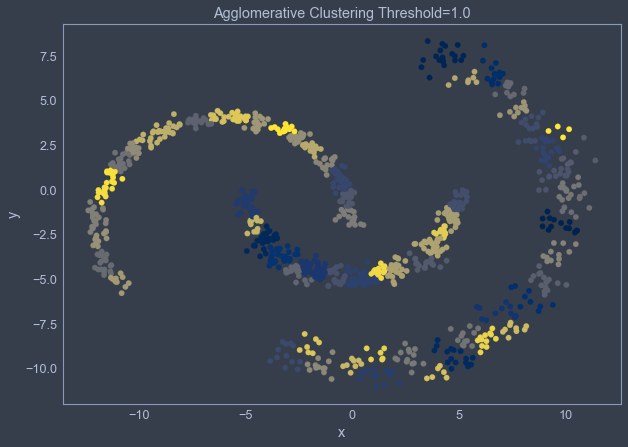

In [319]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=agg_results["1.0"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.0");

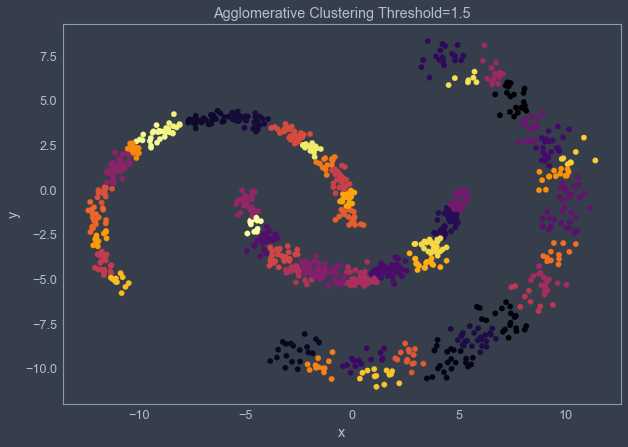

In [320]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=agg_results["1.5"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Agglomerative Clustering Threshold=1.5");

### DB-Scan

#### Dataset 1

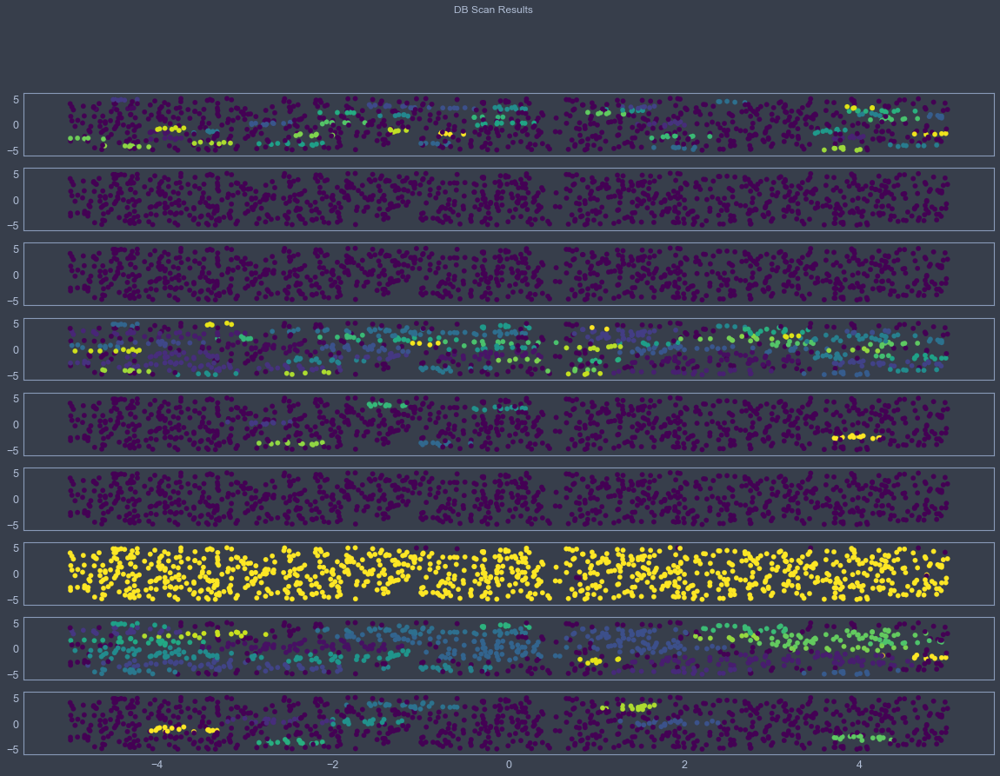

In [359]:
dbscan_results = {}
dbscan_colors = {}
fig, axs = plt.subplots(9, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("DB Scan Results")
eps = [0.25, 0.35, 0.5]
min_samples = [5, 10, 15]
cont = 0
for i in eps:
    for j in min_samples:
        dbscan = DBSCAN(eps=i, min_samples=j)
        dbscan.fit(df1);
        dbscan_results[f"{i}-{j}"] = dbscan.labels_
        axs[cont].scatter(df1["x"], df1["y"], c=dbscan_results[f"{i}-{j}"], cmap='viridis')
        cont += 1

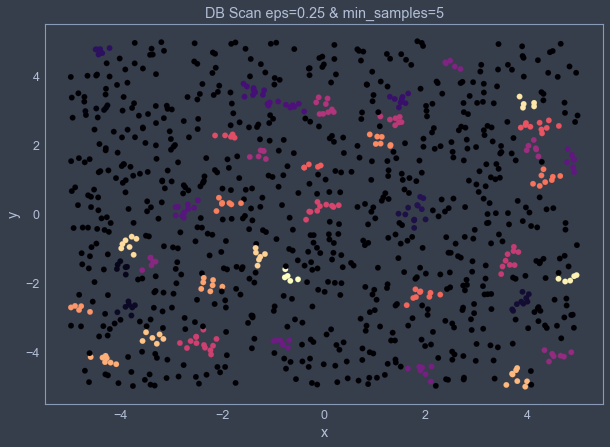

In [335]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.25-5"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=5");

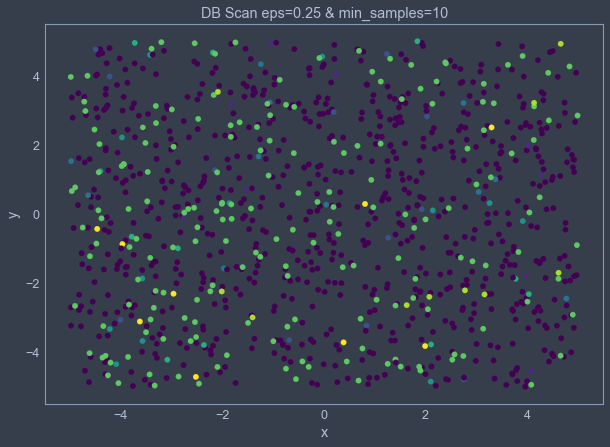

In [358]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.25-10"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=10");

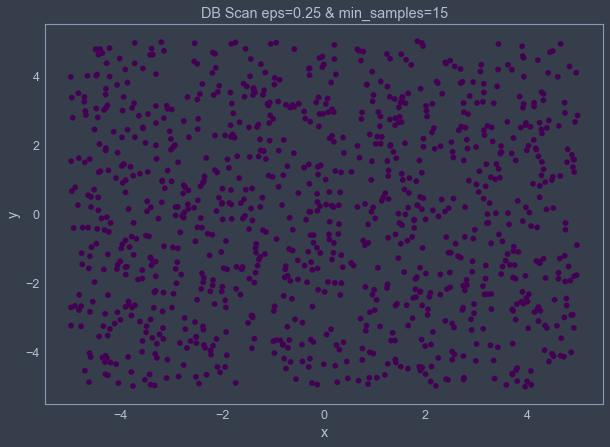

In [338]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.25-15"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=15");

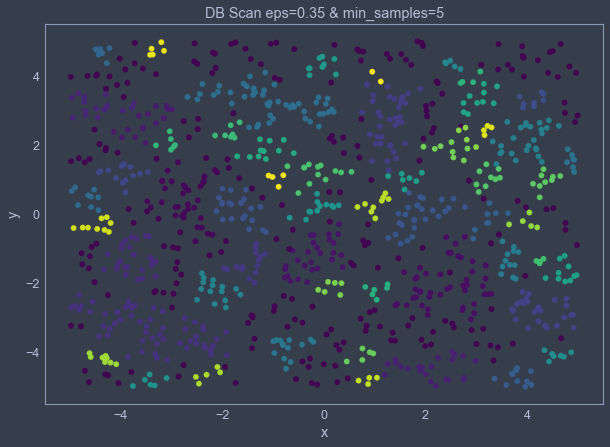

In [340]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.35-5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=5");

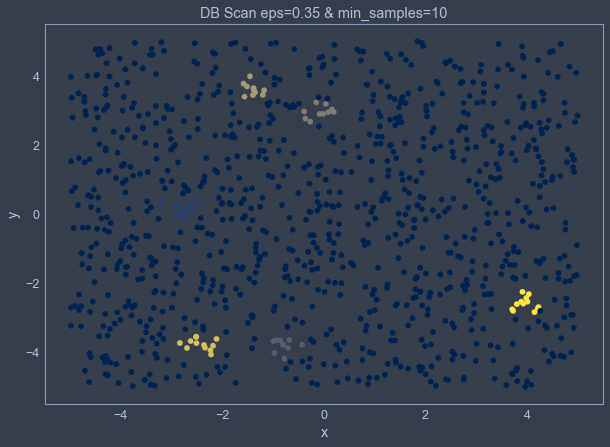

In [341]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.35-10"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=10");

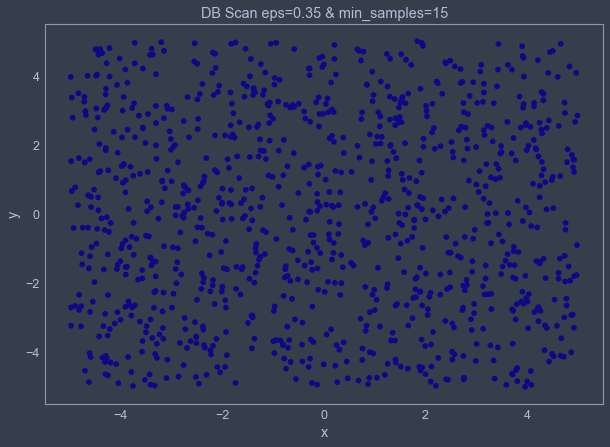

In [344]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.35-15"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=15");

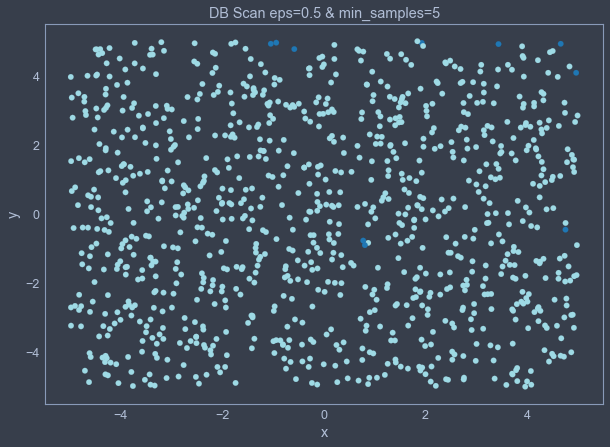

In [354]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.5-5"], cmap="tab20")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=5");

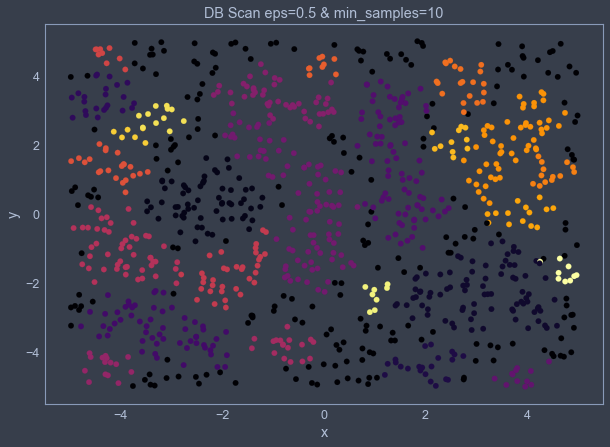

In [347]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.5-10"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=10");

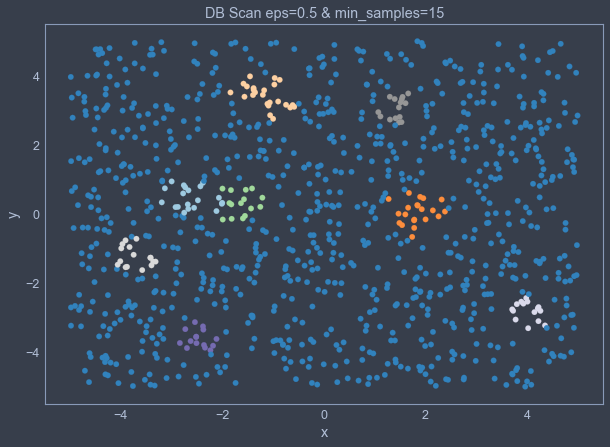

In [349]:
plt.figure(figsize=(10,7))
plt.scatter(df1["x"], df1["y"], c=dbscan_results["0.5-15"], cmap="tab20c")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=15");

#### Dataset 2

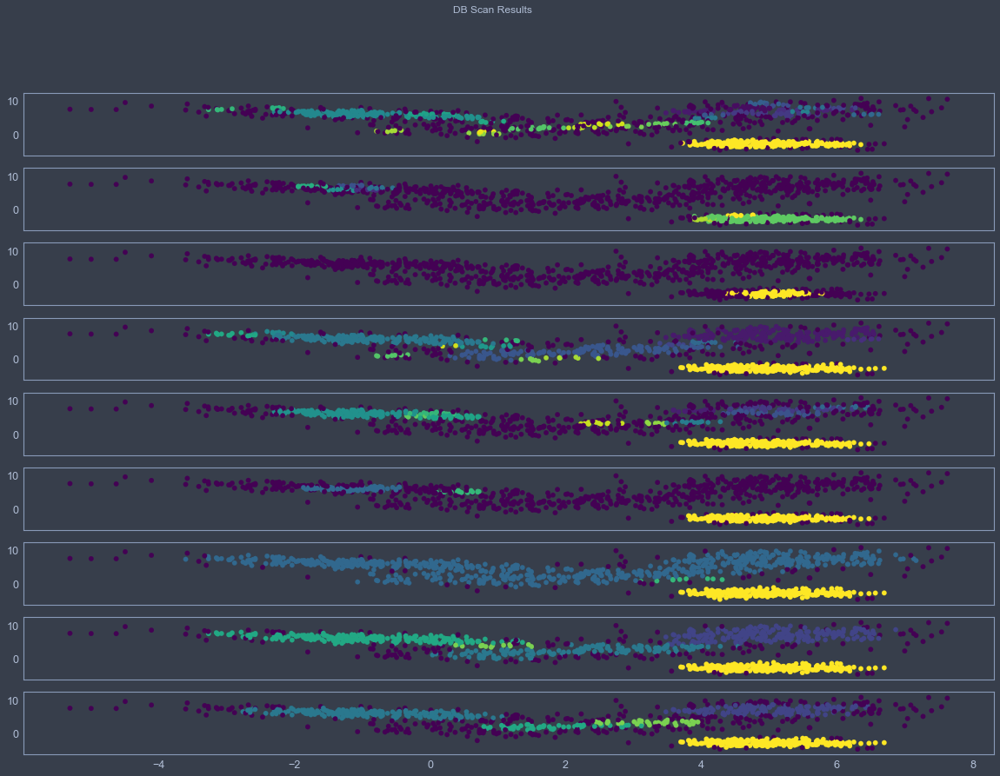

In [360]:
dbscan_results = {}
dbscan_colors = {}
fig, axs = plt.subplots(9, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("DB Scan Results")
eps = [0.25, 0.35, 0.5]
min_samples = [5, 10, 15]
cont = 0
for i in eps:
    for j in min_samples:
        dbscan = DBSCAN(eps=i, min_samples=j)
        dbscan.fit(df2);
        dbscan_results[f"{i}-{j}"] = dbscan.labels_
        axs[cont].scatter(df2["x"], df2["y"], c=dbscan_results[f"{i}-{j}"], cmap='viridis')
        cont += 1

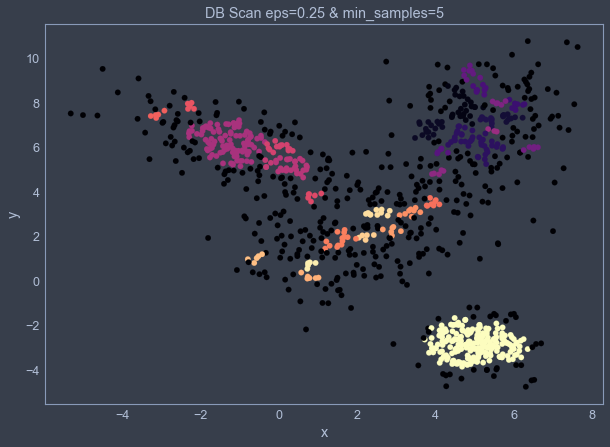

In [356]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.25-5"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=5");

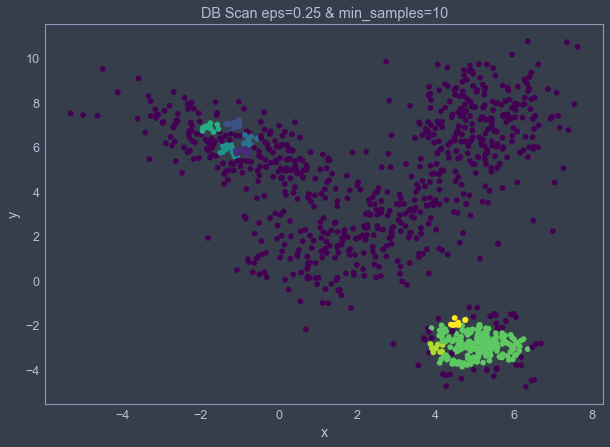

In [361]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.25-10"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=10");

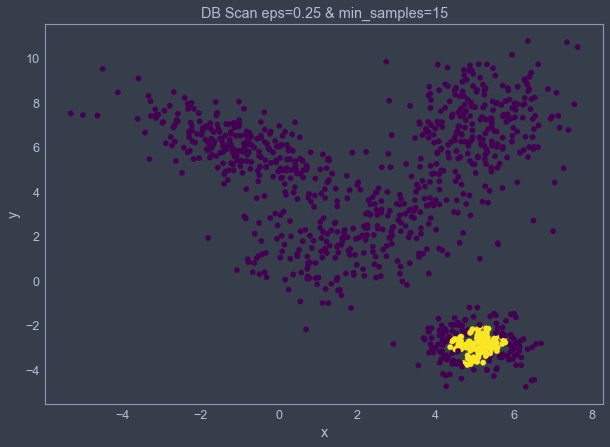

In [362]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.25-15"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=15");

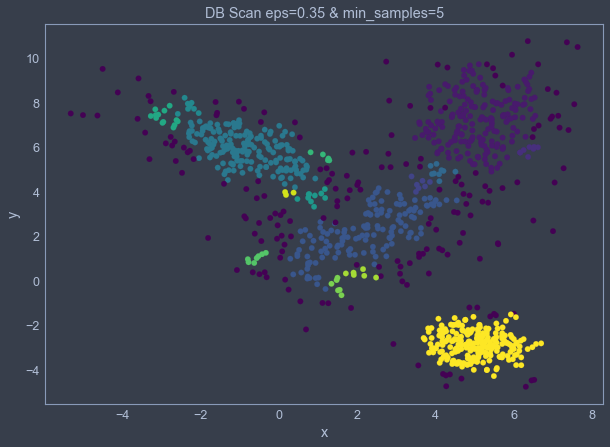

In [363]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.35-5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=5");

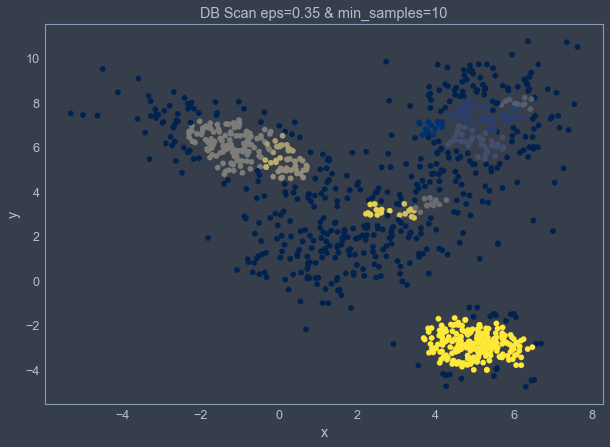

In [364]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.35-10"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=10");

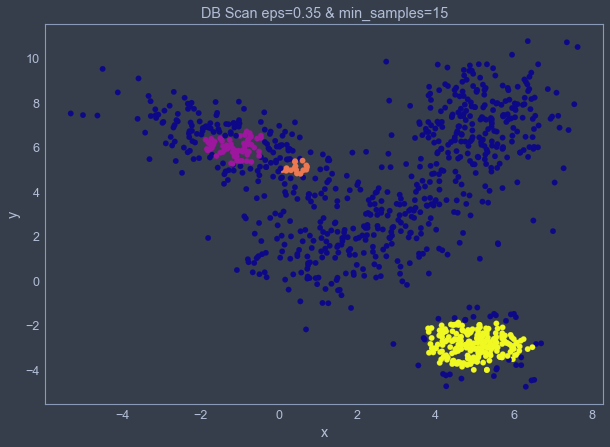

In [365]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.35-15"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=15");

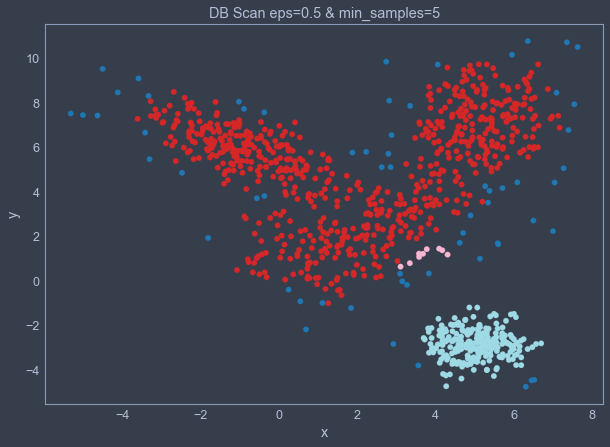

In [366]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.5-5"], cmap="tab20")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=5");

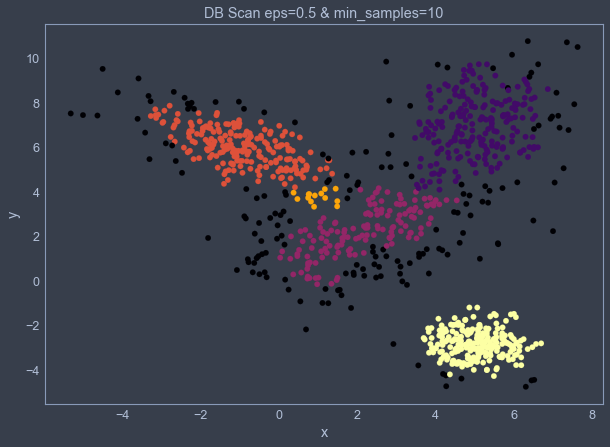

In [367]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.5-10"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=10");

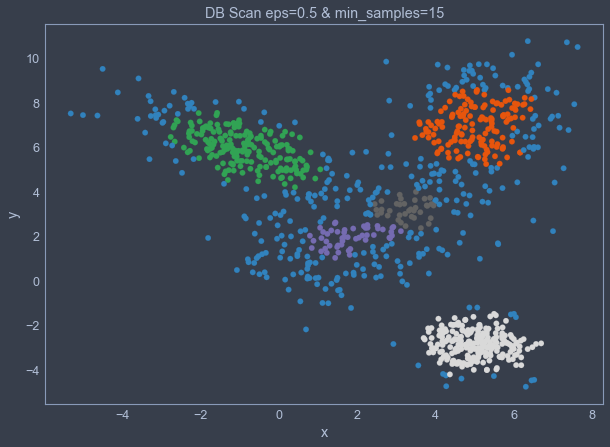

In [368]:
plt.figure(figsize=(10,7))
plt.scatter(df2["x"], df2["y"], c=dbscan_results["0.5-15"], cmap="tab20c")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=15");

#### Dataset 3

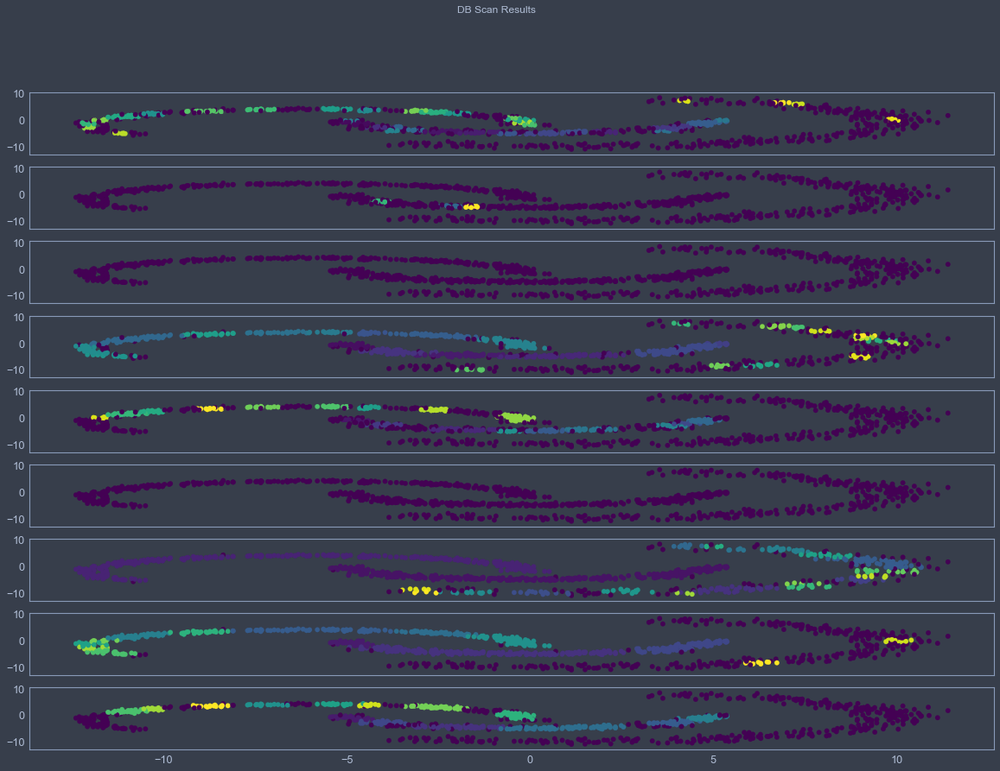

In [369]:
dbscan_results = {}
dbscan_colors = {}
fig, axs = plt.subplots(9, sharex=True, sharey=True, figsize=(20,14))
fig.suptitle("DB Scan Results")
eps = [0.25, 0.35, 0.5]
min_samples = [5, 10, 15]
cont = 0
for i in eps:
    for j in min_samples:
        dbscan = DBSCAN(eps=i, min_samples=j)
        dbscan.fit(df3);
        dbscan_results[f"{i}-{j}"] = dbscan.labels_
        axs[cont].scatter(df3["x"], df3["y"], c=dbscan_results[f"{i}-{j}"], cmap='viridis')
        cont += 1

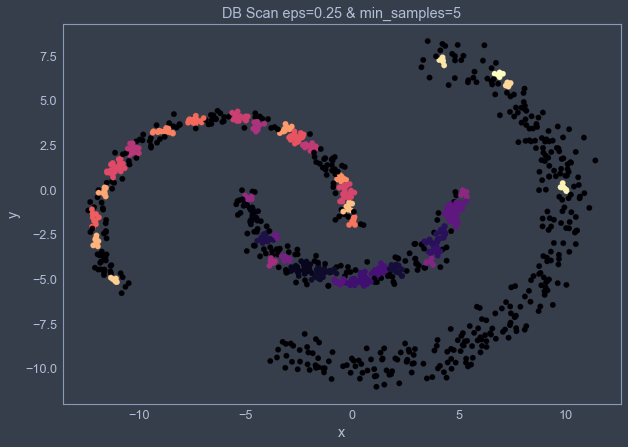

In [370]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.25-5"], cmap="magma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=5");

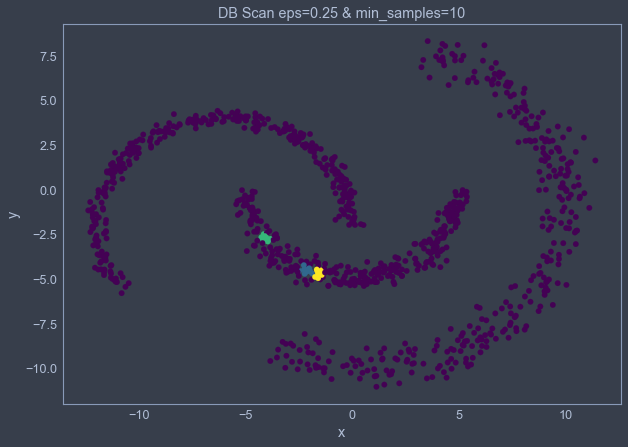

In [371]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.25-10"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=10");

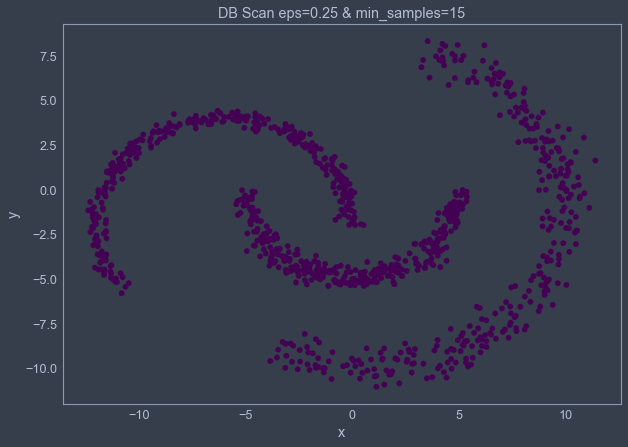

In [372]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.25-15"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.25 & min_samples=15");

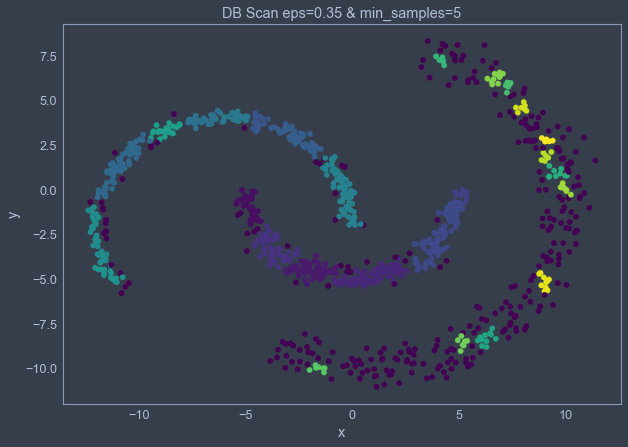

In [373]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.35-5"], cmap="viridis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=5");

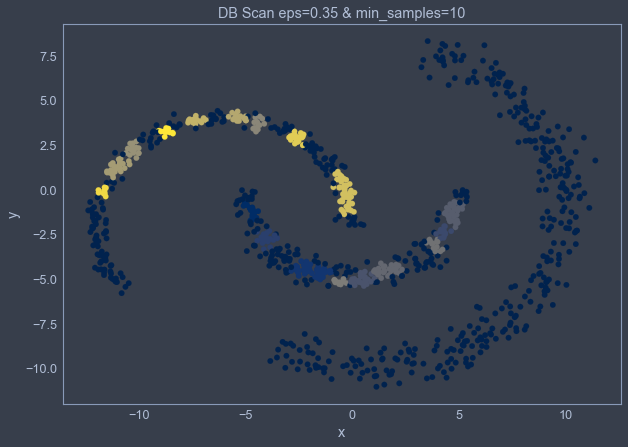

In [374]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.35-10"], cmap="cividis")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=10");

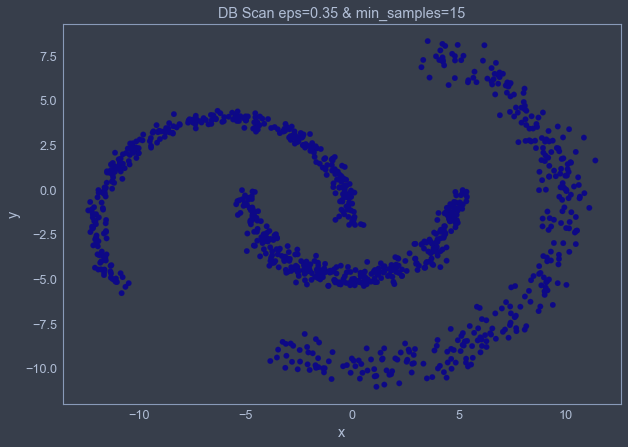

In [376]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.35-15"], cmap="plasma")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.35 & min_samples=15");

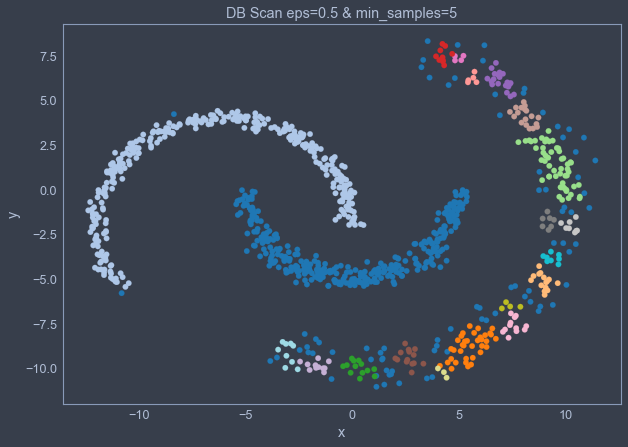

In [377]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.5-5"], cmap="tab20")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=5");

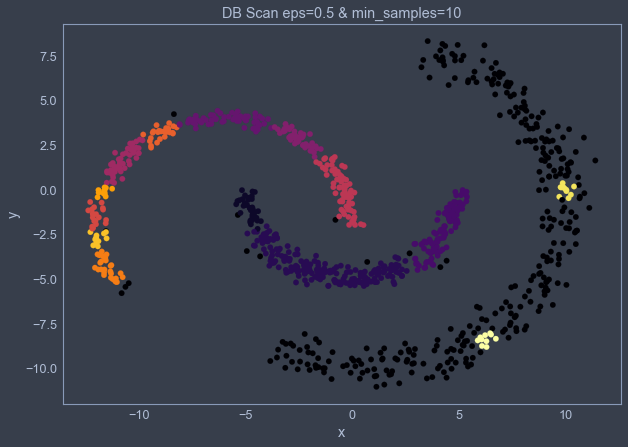

In [378]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.5-10"], cmap="inferno")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=10");

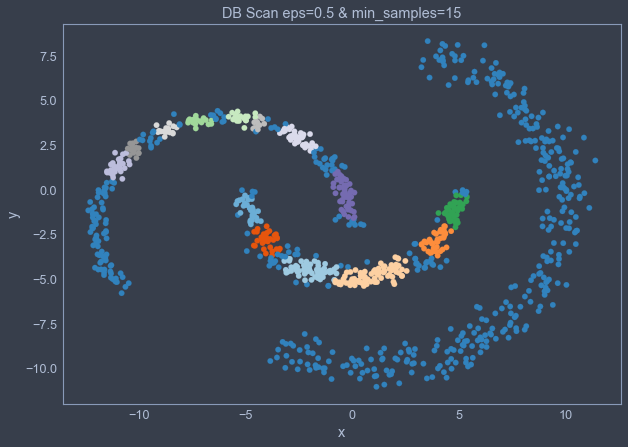

In [379]:
plt.figure(figsize=(10,7))
plt.scatter(df3["x"], df3["y"], c=dbscan_results["0.5-15"], cmap="tab20c")
plt.xlabel("x")
plt.ylabel("y")
plt.title("DB Scan eps=0.5 & min_samples=15");

## Part 2 - K-Nearest Neighbors
Use a dataset of OS preferrence based on 15 features

### Data Visualization and EDA

In [380]:
df4 = pd.read_csv("./Datasets/os_training_data.csv")
df4.head(10)

,accessiblity,cs_research,designer,entertainment,expert_user,fanatic,gamer,old_hardware,privacy,programmer,reliable,security,software,tech_support,willing_pay,class
0,No,No,No,Si,No,No,No,No,Si,No,Si,No,Si,No,No,linux
1,No,No,No,No,No,Si,Si,Si,No,Si,No,No,No,Si,Si,linux
2,No,Si,No,Si,No,Si,No,No,Si,No,No,No,No,No,Si,linux
3,No,No,No,Si,No,No,Si,No,No,Si,No,No,No,Si,Si,windows
4,No,No,No,Si,No,No,No,No,Si,No,Si,No,No,No,Si,linux
5,No,No,No,Si,Si,No,No,No,No,No,No,Si,No,No,No,linux
6,Si,No,No,Si,No,Si,No,No,No,No,Si,No,No,No,Si,windows
7,No,No,No,No,Si,Si,No,No,Si,No,No,Si,Si,No,No,linux
8,No,No,No,No,Si,No,No,Si,No,No,Si,Si,Si,No,No,linux
9,No,No,No,Si,Si,No,No,No,No,No,Si,No,No,No,No,linux


In [381]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   accessiblity   200 non-null    object
 1   cs_research    200 non-null    object
 2   designer       200 non-null    object
 3   entertainment  200 non-null    object
 4   expert_user    200 non-null    object
 5   fanatic        200 non-null    object
 6   gamer          200 non-null    object
 7   old_hardware   200 non-null    object
 8   privacy        200 non-null    object
 9   programmer     200 non-null    object
 10  reliable       200 non-null    object
 11  security       200 non-null    object
 12  software       200 non-null    object
 13  tech_support   200 non-null    object
 14  willing_pay    200 non-null    object
 15  class          200 non-null    object
dtypes: object(16)
memory usage: 25.1+ KB


### Data Preprocessing

In [440]:
def preProcess(df):
    df_dict = {}
    size = df.shape[0]
    for col in df.columns.tolist():
        df_dict[col] = []
        for i in range(size):
            if col != 'class':
                df_dict[col].append(1 if df.loc[i,col]=="Si" else 0)
            else:
                df_dict[col].append(df.loc[i,col])
    return pd.DataFrame(df_dict)

In [433]:
df4v2 = preProcess(df4)
df4v2.head(10)


,accessiblity,cs_research,designer,entertainment,expert_user,fanatic,gamer,old_hardware,privacy,programmer,reliable,security,software,tech_support,willing_pay,class
0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,linux
1,0,0,0,0,0,1,1,1,0,1,0,0,0,1,1,linux
2,0,1,0,1,0,1,0,0,1,0,0,0,0,0,1,linux
3,0,0,0,1,0,0,1,0,0,1,0,0,0,1,1,windows
4,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,linux
5,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,linux
6,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,windows
7,0,0,0,0,1,1,0,0,1,0,0,1,1,0,0,linux
8,0,0,0,0,1,0,0,1,0,0,1,1,1,0,0,linux
9,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,linux


In [449]:
knn = KNeighborsClassifier()
k = [1, 3, 5, 7, 9, 11, 13, 15]
df_test = pd.read_csv("./Datasets/os_testing_data.csv")
df_testv2 = preProcess(df_test)

for i, k_val in enumerate(k):
    knn = KNeighborsClassifier(n_neighbors=k_val, algorithm='ball_tree')
    knn.fit(df4v2.loc[:, df4v2.columns != 'class'], df4v2['class'])
    predicted = knn.predict(df4v2.loc[:, df4v2.columns != 'class'])
    print(f"------------Training Set Performance: k = {k_val}------------")
    print("Accuracy:", metrics.accuracy_score(predicted, df4v2['class']))
    print(metrics.classification_report(predicted, df4v2['class'], labels=['windows']))
    print(f"------------Testing Set Performance: k = {k_val}-------------")
    start = time.time()
    predicted = knn.predict(df_testv2.loc[:, df_testv2.columns != 'class'])
    end = time.time()
    print(f"Prediction Time on Test Set: {(end-start)*1000}ms")
    print("Accuracy:", metrics.accuracy_score(predicted, df_testv2['class']))    
    print(metrics.classification_report(predicted, df_testv2['class'], labels=['windows']))
    

------------Training Set Performance: k = 1------------
Accuracy: 0.99
              precision    recall  f1-score   support

     windows       0.99      0.99      0.99        95

   micro avg       0.99      0.99      0.99        95
   macro avg       0.99      0.99      0.99        95
weighted avg       0.99      0.99      0.99        95

------------Testing Set Performance: k = 1-------------
Prediction Time on Test Set: 2.992868423461914ms
Accuracy: 0.76
              precision    recall  f1-score   support

     windows       0.77      0.82      0.79        28

   micro avg       0.77      0.82      0.79        28
   macro avg       0.77      0.82      0.79        28
weighted avg       0.77      0.82      0.79        28

------------Training Set Performance: k = 3------------
Accuracy: 0.91
              precision    recall  f1-score   support

     windows       0.95      0.87      0.91       103

   micro avg       0.95      0.87      0.91       103
   macro avg       0.95     

## Part 3 - Linear Regression

### EDA

In [510]:
df5 = pd.read_csv("./Datasets/datos_4_train.csv")
df5.head(10)
df5_test = pd.read_csv("./Datasets/datos_4_test.csv")

In [511]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   rating       1000 non-null   float64
 1   fav_genre    1000 non-null   float64
 2   cast         1000 non-null   float64
 3   advertising  1000 non-null   float64
 4   length       1000 non-null   float64
 5   score        1000 non-null   float64
dtypes: float64(6)
memory usage: 47.0 KB


In [512]:
df5.describe()

,rating,fav_genre,cast,advertising,length,score
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,3.061845,0.490854,5.090739,0.508342,119.299227,2.508567
std,1.164914,0.286407,2.823982,0.300204,34.287613,0.914462
min,1.011927,0.000218,0.022662,0.003089,60.011194,0.305965
25%,2.021036,0.242861,2.738098,0.242547,90.770746,1.860524
50%,3.071174,0.490976,5.136791,0.500572,118.072426,2.497003
75%,4.076772,0.742198,7.422005,0.788235,148.566359,3.178424
max,4.995313,0.996196,9.996668,0.999717,179.999152,4.813378


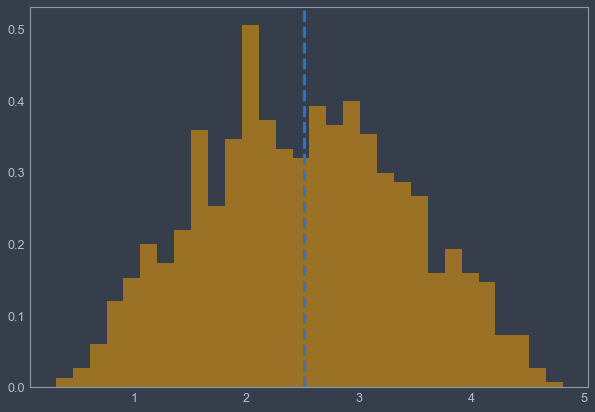

In [513]:
plt.figure(figsize=(10,7))
plt.hist(df5["score"], bins=30, alpha=0.5, color="orange", density=True)
plt.axvline(df5["score"].agg("mean"), lw=3, ls="--");

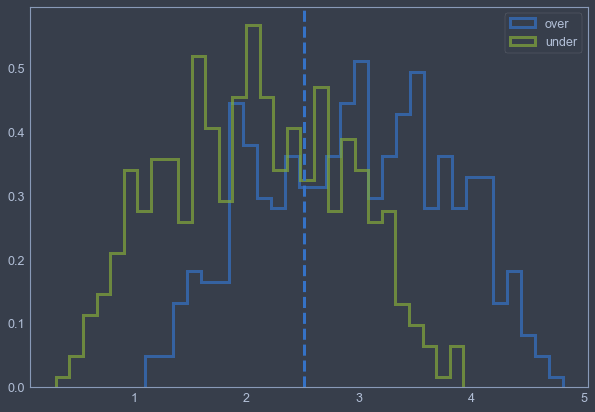

In [514]:
half = 0.5
mask = df5["fav_genre"]<=half
over = df5[~mask]
under = df5[mask]
plt.figure(figsize=(10,7))
plt.hist(over["score"], bins=30, lw=3, alpha=0.7, density=True, histtype="step", label="over")
plt.hist(under["score"], bins=30, lw=3, alpha=0.7, density=True, histtype="step", label="under")
plt.axvline(df5["score"].agg("mean"), lw=3, ls="--");
plt.legend()

In [520]:
#Linear Regression without Normalization nor Lasso Regularization
lr = LinearRegression()
lr.fit(df5.loc[:, df5.columns != "score"], df5["score"])
print(f"Regressors' Coefficients: {lr.coef_}")
print(f"Bias Term: {lr.intercept_}")
predicted = lr.predict(df5.loc[:, df5.columns != "score"])
print(f"Training Data MSE: {metrics.mean_squared_error(df5['score'], predicted)}")
predicted = lr.predict(df5_test.loc[:, df5_test.columns != "score"])
print(f"Testing Data MSE: {metrics.mean_squared_error(df5_test['score'], predicted)}")

Regressors' Coefficients: [ 1.49482315e-01  1.59137901e+00  2.54952149e-01  1.89129953e-01
 -7.49372447e-04]
Bias Term: -0.03489688908984645
Training Data MSE: 0.0231035719357498
Testing Data MSE: 0.019920588833919062


In [531]:
#Linear Regression with Normalization but without Lasso Regularization
lr = LinearRegression(normalize=True)
lr.fit(df5.loc[:, df5.columns != "score"], df5["score"])
print(f"Regressors' Coefficients: {lr.coef_}")
print(f"Bias Term: {lr.intercept_}")
predicted = lr.predict(df5.loc[:, df5.columns != "score"])
print(f"Training Data MSE: {metrics.mean_squared_error(df5['score'], predicted)}")
predicted = lr.predict(df5_test.loc[:, df5_test.columns != "score"])
print(f"Testing Data MSE: {metrics.mean_squared_error(df5_test['score'], predicted)}")

Regressors' Coefficients: [ 1.49482315e-01  1.59137901e+00  2.54952149e-01  1.89129953e-01
 -7.49372447e-04]
Bias Term: -0.03489688908982291
Training Data MSE: 0.0231035719357498
Testing Data MSE: 0.01992058883391874


In [535]:
#Linear Regression without Normalization but with Lasso Regularization
lr = Lasso(alpha=0.01)
lr.fit(df5.loc[:, df5.columns != "score"], df5["score"])
print(f"Regressors' Coefficients: {lr.coef_}")
print(f"Bias Term: {lr.intercept_}")
predicted = lr.predict(df5.loc[:, df5.columns != "score"])
print(f"Training Data MSE: {metrics.mean_squared_error(df5['score'], predicted)}")
predicted = lr.predict(df5_test.loc[:, df5_test.columns != "score"])
print(f"Testing Data MSE: {metrics.mean_squared_error(df5_test['score'], predicted)}")

Regressors' Coefficients: [ 1.43224092e-01  1.46885149e+00  2.54644746e-01  7.99171459e-02
 -7.24934802e-04]
Bias Term: 0.0985749035532697
Training Data MSE: 0.025486866743417467
Testing Data MSE: 0.023409411770148294


In [559]:
#Linear Regression with Normalization but with Lasso Regularization
lr = Lasso(normalize=True, alpha=0.01)
lr.fit(df5.loc[:, df5.columns != "score"], df5["score"])
print(f"Regressors' Coefficients: {lr.coef_}")
print(f"Bias Term: {lr.intercept_}")
predicted = lr.predict(df5.loc[:, df5.columns != "score"])
print(f"Training Data MSE: {metrics.mean_squared_error(df5['score'], predicted)}")
#l2_norm = np.linalg.norm(df5_test.loc[:,df5_test.columns != "score"].values, axis=1)
#norm_test_data = df5_test.loc[:,df5_test.columns!="score"].divide(l2_norm, axis=0)
predicted = lr.predict(df5_test.loc[:, df5_test.columns != "score"])
print(f"Testing Data MSE: {metrics.mean_squared_error(df5_test['score'], predicted)}")

Regressors' Coefficients: [ 0.          0.55924918  0.1516753   0.         -0.        ]
Bias Term: 1.4619182106847854
Training Data MSE: 0.24192239438854787
Testing Data MSE: 0.21494591737306745


In [550]:
df5_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   rating       250 non-null    float64
 1   fav_genre    250 non-null    float64
 2   cast         250 non-null    float64
 3   advertising  250 non-null    float64
 4   length       250 non-null    float64
 5   score        250 non-null    float64
dtypes: float64(6)
memory usage: 11.8 KB


## Part 4 - Logistic Regression

In [562]:
lr = LogisticRegression()
df_test = pd.read_csv("./Datasets/os_testing_data.csv")
df_testv2 = preProcess(df_test)

lr.fit(df4v2.loc[:, df4v2.columns != 'class'], df4v2['class'])
predicted = lr.predict(df4v2.loc[:, df4v2.columns != 'class'])
print(f"------------Training Set Performance------------")
print("Accuracy:", metrics.accuracy_score(predicted, df4v2['class']))
print(metrics.classification_report(predicted, df4v2['class'], labels=['windows']))
print(f"------------Testing Set Performance-------------")
start = time.time()
predicted = lr.predict(df_testv2.loc[:, df_testv2.columns != 'class'])
end = time.time()
print(f"Prediction Time on Test Set: {(end-start)*1000}ms")
print("Accuracy:", metrics.accuracy_score(predicted, df_testv2['class']))    
print(metrics.classification_report(predicted, df_testv2['class'], labels=['windows']))

------------Training Set Performance------------
Accuracy: 0.895
              precision    recall  f1-score   support

     windows       0.91      0.88      0.89        98

   micro avg       0.91      0.88      0.89        98
   macro avg       0.91      0.88      0.89        98
weighted avg       0.91      0.88      0.89        98

------------Testing Set Performance-------------
Prediction Time on Test Set: 2.2668838500976562ms
Accuracy: 0.84
              precision    recall  f1-score   support

     windows       0.93      0.82      0.87        34

   micro avg       0.93      0.82      0.87        34
   macro avg       0.93      0.82      0.87        34
weighted avg       0.93      0.82      0.87        34

